## 1. Preparation and Preprocessing

In [1]:
# !pip install git+https://github.com/deamonpog/gsdmm.git
# !pip install wordcloud
# !pip install --upgrade gensim
# !pip install --upgrade s3fs
# !pip install --upgrade boto3
# !pip install --upgrade numexpr
# !pip install --upgrade pandas

In [2]:
import string
import re
import html
import json
import gzip
import datetime
import itertools
import glob
import pytz
import numpy as np
import pandas as pd

from wordcloud import WordCloud

import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import gensim
from gsdmm import MovieGroupProcess

In [4]:
import nltk

from nltk.stem import WordNetLemmatizer
nltk.download("wordnet")
nltk.download("omw-1.4")

# punctuation
nltk.download("punkt")

# pos tagging
nltk.download('averaged_perceptron_tagger')
nltk.download('tagsets')

from nltk.tokenize import word_tokenize

from nltk.corpus import stopwords 
nltk.download('stopwords')

[nltk_data] Downloading package wordnet to /home/ec2-user/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/ec2-user/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to /home/ec2-user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package tagsets to /home/ec2-user/nltk_data...
[nltk_data]   Package tagsets is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
# s3 specific libraries
import boto3
s3 = boto3.resource("s3")

import s3fs
s3fs = s3fs.S3FileSystem(anon=False)

# data is at s3://mips-main-tests/chathura_tests/cache2/*cache*.json.gzip

In [6]:
from time_keeper import TimeKeeper
from elbow_detection import get_elbow

In [7]:
english_stop_words = set(stopwords.words('english'))

In [8]:
%%time
tdf = pd.read_csv("all_data_raw_df_v5.csv", dtype=str)
tdf["created_at"] = tdf["created_at"].apply(lambda x: datetime.datetime.strptime(x, "%Y-%m-%dT%H:%M:%S.%f%z"))
tdf

CPU times: user 3min 36s, sys: 8.88 s, total: 3min 45s
Wall time: 3min 45s


,id,conversation_id,edit_history_tweet_ids,author_id,created_at,text,impression_count,like_count,quote_count,reply_count,retweet_count,quoted,replied_to,retweeted,in_reply_to_user_id,geo,mentions
0,1509757106202849291,1500971180395802633,['1509757106202849291'],1385729645740449804,2022-04-01 04:58:38+00:00,@Peroporqu_ :),0,0,0,0,0,[],['1500971180395802633'],[],1500536286591033351,NaN,['1500536286591033351']
1,1509756641117319168,1509756641117319168,['1509756641117319168'],4501930040,2022-04-01 04:56:47+00:00,RT @purpleluvrain: @jlints58 love it dear swee...,0,0,0,0,1,[],[],['1509404114555334659'],NaN,NaN,"['781947948934369280', '4501930040']"
2,1509756540265414656,1509732884608860161,['1509756540265414656'],28729354,2022-04-01 04:56:23+00:00,@StephanieNTX @dfwhispanic @Raquel_AmparoTV @S...,0,0,0,0,0,[],['1509743982724595715'],[],3173688997,NaN,"['3173688997', '761051', '402718868', '7663422..."
3,1509756323231002627,1507144019482083339,['1509756323231002627'],4501930040,2022-04-01 04:55:32+00:00,@SFDamnPodcast @alvatabitha I've been wonderin...,0,0,0,0,0,[],['1509402710470103044'],[],1248074962377699328,NaN,"['1248074962377699328', '66141034']"
4,1509756190716096512,1509756190716096512,['1509756190716096512'],4501930040,2022-04-01 04:55:00+00:00,RT @SFDamnPodcast: @alvatabitha @jlints58 a gr...,0,0,0,0,1,[],[],['1509402710470103044'],NaN,NaN,"['1248074962377699328', '66141034', '4501930040']"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14060530,1465918181088710659,1465918181088710659,['1465918181088710659'],25444322,2021-12-01 05:38:24+00:00,#GetVaccinated https://t.co/MHvXKKv5Fv,0,0,0,0,0,['1465701709112434693'],[],[],NaN,"Union City, CA",[]
14060531,1465918067775447045,1465918067775447045,['1465918067775447045'],25444322,2021-12-01 05:37:57+00:00,RT @UncvrngTheTruth: Jim Jordan said Biden thi...,0,0,0,0,358,[],[],['1465487354546638853'],NaN,NaN,[]
14060532,1465914960844705794,1465803774291677187,['1465914960844705794'],40091601,2021-12-01 05:25:36+00:00,@SoCassandra another family star,0,0,0,0,0,[],['1465803774291677187'],[],48928145,NaN,['48928145']
14060533,1465914356332326914,1465914290435772417,['1465914356332326914'],40091601,2021-12-01 05:23:12+00:00,@dmschmeyer *saves*,0,0,0,0,0,[],['1465914290435772417'],[],732409522778742784,NaN,['732409522778742784']


In [9]:
additional_common_words = {'&amp;',
                             '-',
                             'day',
                             'first',
                             'get',
                             'it’s',
                             'know',
                             'last',
                             'like',
                             'make',
                             'need',
                             'new',
                             'one',
                             'rt',
                             'see',
                             'still',
                             'time',
                             'today',
                             'us',
                             'would'}

In [10]:
words_to_remove = english_stop_words.union(additional_common_words)
print(words_to_remove)

{'below', 'both', 'didn', 'last', '-', 'his', 'very', 'own', 'y', "needn't", 't', "she's", 'wasn', "hadn't", 're', 'too', 'this', "isn't", 'where', 'into', 'out', "you'll", "it's", 'such', 'us', 'over', 'same', 'than', 'couldn', "won't", 'under', 'that', 'an', 'its', 'll', 'weren', "you're", 'hadn', "you've", 'been', 'as', 'down', 'has', 'before', 'what', 'like', 'herself', "wasn't", 'i', 'they', 'won', 'he', 'are', 'because', 'in', 'through', 'few', "don't", 'will', 'until', 'how', 'o', 'rt', 'at', 'up', "wouldn't", 'some', 'being', 'd', 'ma', 'now', "should've", 'yourselves', "you'd", 'was', 'were', 'by', 'myself', 'then', 'these', 'know', "weren't", "hasn't", 'no', 'while', "shouldn't", 'see', 'on', 'just', 'them', 'mightn', 've', 'should', 'shouldn', 'further', "didn't", 'me', 'those', "doesn't", 'when', 'your', 'ourselves', 'whom', 'and', 'hasn', 'so', 'having', 'who', 'themselves', 'm', 'today', 'doesn', 'need', 'don', 'would', 'my', 'above', 'from', 'she', 'had', 'day', 'yoursel

In [33]:
class Modify:
    def __init__(self, obj):
        self.obj = obj

    def rem(self, regex, ignore_case=True):
        if ignore_case:
            return Modify( re.sub(regex, "", self.obj, flags=re.IGNORECASE) )
        else:
            return Modify( re.sub(regex, "", self.obj) )

    def res(self, regex, ignore_case=True):
        if ignore_case:
            return Modify( re.sub(regex, " ", self.obj, flags=re.IGNORECASE) )
        else:
            return Modify( re.sub(regex, " ", self.obj) )

    def resub(self, regex, sub, ignore_case=True):
        if ignore_case:
            return Modify( re.sub(regex, sub, self.obj, flags=re.IGNORECASE) )
        else:
            return Modify( re.sub(regex, sub, self.obj) )

    def value(self):
        return self.obj


RE_HTML_ENTITIES = r'&[A-Za-z0-9]+;'
RE_HTTP_LINKS = r"https?://\S+"
RE_STOPWORDS = r'\b(?:' + '|'.join(english_stop_words) + r')\b'
RE_MENTIONS = r'@\w+'
RE_REMOVEWORDS = r'\b(?:' + '|'.join(words_to_remove) + r')\b'

In [34]:
def basic_preproc(this_text):
    return Modify(this_text).res(RE_HTML_ENTITIES).res(RE_HTTP_LINKS).rem(RE_REMOVEWORDS).res(r"\s+").value()

In [50]:
def show_output(gsdmm_obj):
    # print number of documents per topic
    doc_count = np.array(gsdmm_obj.cluster_doc_count)
    print('Number of documents per topic :', doc_count)

    # Topics sorted by the number of document they are allocated to
    top_index = doc_count.argsort()[-15:][::-1]
    print('Most important clusters (by number of text_tokens inside):', top_index)

    # define function to get top words per topic
    def top_words(cluster_word_distribution, top_cluster, values):
        for cluster in top_cluster:
            sort_dicts = sorted(cluster_word_distribution[cluster].items(), key=lambda k: k[1], reverse=True)[:values]
            print("\nCluster %s : %s"%(cluster, sort_dicts))

    # get top words in topics
    tw = top_words(gsdmm_obj.cluster_word_distribution, top_index, 20)
    return top_index, tw

In [51]:
def draw_wordcloud(gsdmm_obj, topic_number, values = 20):
    # Get topic word distributions from gsdmm model
    cluster_word_distribution = gsdmm_obj.cluster_word_distribution
    
    # Select topic you want to output as dictionary (using topic_number)
    topic_dict = sorted(cluster_word_distribution[topic_number].items(), key=lambda k: k[1], reverse=True)
    
    # Generate a word cloud image
    wc = WordCloud(background_color='#fcf2ed', 
                                width=1800,
                                height=700,
                                random_state = 123,
                                font_path="Symbola.otf",
                                colormap='flag')
    
    wc.generate_from_frequencies(dict(topic_dict[:values]))

    print(topic_number, topic_dict[:values])
    
    # Print to screen
    fig, ax = plt.subplots(figsize=[10,10])
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    
    # Save to disk
    wc.to_file(f"./wc_{topic_number}.png")
    
    plt.show()

## 2. Most Basic Raw Model

In [45]:
def process_raw_doc_list(identifier, text_list):
    tk = TimeKeeper("basic-pre-process")
    results = [basic_preproc(tweet_text) if type(tweet_text) is str else tweet_text for tweet_text in text_list]

    tk.next("split into tokens")
    text_tokens = [ doc.split() if type(doc) is str else [] for doc in results ]

    # create dictionary of all words in all documents
    tk.next("create dictionary")
    dictionary = gensim.corpora.Dictionary(text_tokens)

    # filter extreme cases out of dictionary
    tk.next("filter extremes")
    dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)

    # create variable containing length of dictionary/vocab
    vocab_length = len(dictionary)

    # create BOW dictionary
    tk.next("create bag of words dictionary")
    bow_corpus = [dictionary.doc2bow(doc) for doc in text_tokens]

    # initialize GSDMM
    gsdmm = MovieGroupProcess(K=10, alpha=0.1, beta=0.3, n_iters=15)

    # fit GSDMM model
    tk.next("fit GSDMM model")
    y = gsdmm.fit(text_tokens, vocab_length)

    tk.next("save model file")
    gsdmm.save(f"./models/gsdmm_model_{identifier}")
    
    tk.done()
    
    return gsdmm

In [ ]:
%%time
gsdmm_model_all_basic_preproc_draft = process_raw_doc_list("all_basic_preproc_draft", tdf["text"].values)
gsdmm_model_all_basic_preproc_draft

basic-pre-process...
basic-pre-process done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=1522.048318135 seconds
split into tokens...
split into tokens done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=56.019874341000104 seconds
create dictionary...
create dictionary done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=5917.954270568 seconds
filter extremes...
filter extremes done.  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=3.1020312439995905 seconds
create bag of words dictionary...
create bag of words dictionary done.  ...  ...  ...  ...  ...  ...  ...  ... T=140.43653086299855 seconds
fit GSDMM model...
In stage 0: transferred 12164884 clusters with 10 clusters populated
In stage 1: transferred 9869128 clusters with 10 clusters populated
In stage 2: transferred 5903254 clusters with 10 clusters populated
In stage 3: transferred 3297154 clusters with 10 clusters populated
In stage 4: transferred 2434028 clusters with 10 clusters populated
In

Number of documents per topic : [1457406  398958 2303028 2663069 1307663 1382636 1107708 1302624 1346691
  790752]
Most important clusters (by number of text_tokens inside): [3 2 0 5 8 4 7 6 9 1]

Cluster 3 : [('’', 515144), ('.', 452349), ("'", 349523), ('…', 323560), (',', 228187), ('people', 186242), ('think', 93220), ('"', 78667), ('?', 76341), ('want', 72320), ('going', 72077), ('“', 67406), ('Trump', 64025), ('never', 61772), ('really', 58304), ('many', 57403), ('right', 56528), ('even', 56130), ('-', 52912), ('say', 52337)]

Cluster 2 : [('’', 243324), ('.', 238505), ("'", 215817), ('…', 138194), (',', 131104), ('!', 112112), ('love', 69790), ('Happy', 58794), ('Good', 56130), ('Thank', 53819), ('good', 53159), ('?', 43942), ('-', 41404), ('got', 40819), ('much', 37101), ('great', 34440), ('back', 32877), ('little', 32307), ('go', 31953), ('morning', 31749)]

Cluster 0 : [('…', 189642), ("'", 84020), ('’', 80321), ('-', 72565), ('.', 69140), (',', 59501), ('people', 52082), ('CO

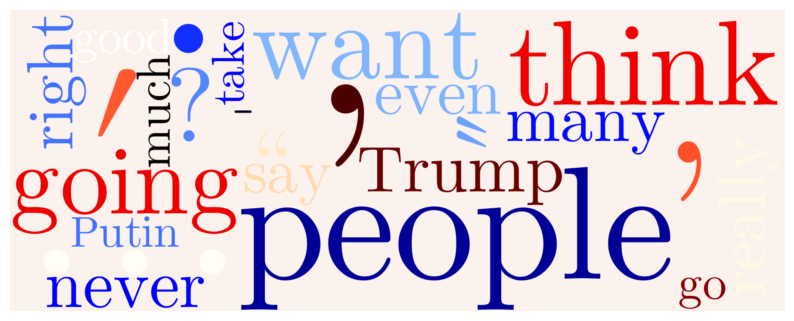

2 [('’', 243324), ('.', 238505), ("'", 215817), ('…', 138194), (',', 131104), ('!', 112112), ('love', 69790), ('Happy', 58794), ('Good', 56130), ('Thank', 53819), ('good', 53159), ('?', 43942), ('-', 41404), ('got', 40819), ('much', 37101), ('great', 34440), ('back', 32877), ('little', 32307), ('go', 31953), ('morning', 31749), ('going', 29669), ('Christmas', 29325), ('want', 28541), ('really', 27877), ('think', 27867)]


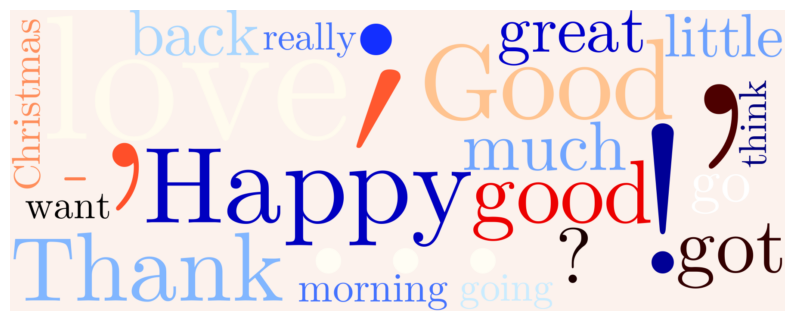

0 [('…', 189642), ("'", 84020), ('’', 80321), ('-', 72565), ('.', 69140), (',', 59501), ('people', 52082), ('COVID19', 40858), (':', 40303), ('climate', 39082), ('COVID', 36586), ('help', 32396), ('"', 32175), ('cases', 29558), ('health', 27591), ('U..', 26709), ('Omicron', 26325), ('many', 25355), ('“', 25164), ('via', 24720), ('work', 24680), ('million', 23876), ('years', 23671), ('could', 23587), ('year', 23017)]


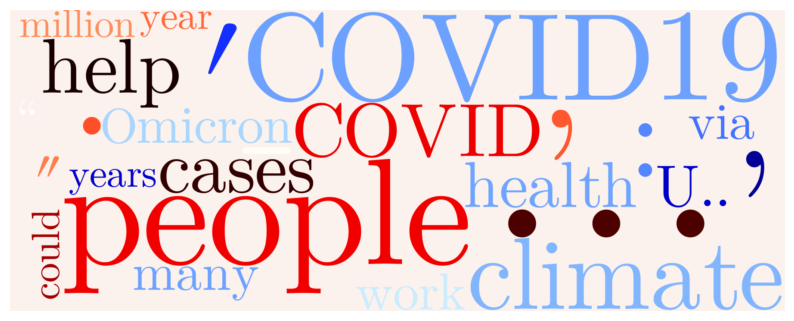

5 [('…', 216958), ('Trump', 183428), ('’', 96565), ('6', 78455), ("'", 71229), ('.', 55819), ('"', 52826), (':', 51370), (',', 49751), ('House', 48201), ('Donald', 48162), ('January', 46335), ('Jan.', 46268), ('says', 46242), ('“', 44970), ('BREAKING:', 44331), ('President', 40935), ('former', 38749), ('-', 37612), ('Biden', 37302), ('said', 36286), ('Capitol', 35955), ('Judge', 35002), ('Republican', 32600), ('Supreme', 31357)]


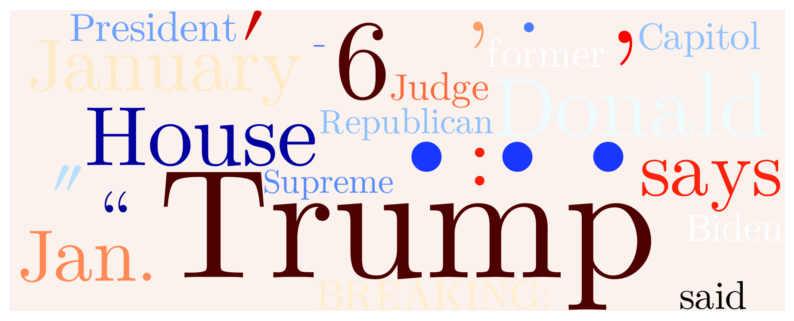

8 [('-', 112192), ('…', 88459), ('.', 69651), ("'", 67160), ('via', 53352), ('’', 48567), ('|', 46918), ('!', 33381), ('"', 33362), (',', 32253), (':', 28809), ('@YouTube', 22028), ('2022', 19330), ('@Joni_Looking:', 18396), ('2', 17204), ('book', 16789), ('game', 16320), ('“', 14874), ('win', 14673), ('years', 14119), ('1', 13832), ('Happy', 13517), ('back', 13034), ('–', 12922), ('3', 12868)]


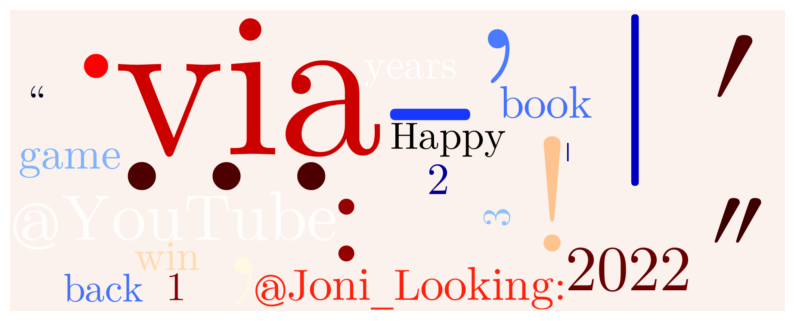

4 [('…', 204819), ('’', 161776), ('.', 93657), ("'", 84770), ('Biden', 76778), (',', 72179), ('Senate', 48996), ('Republicans', 45450), ('President', 45036), ('people', 44692), ('voting', 44134), ('"', 37522), ('bill', 37151), ('vote', 36538), ('Joe', 35101), (':', 34612), ('rights', 33923), ('American', 33691), ('Democrats', 33487), ('state', 32852), ('-', 32800), ('GOP', 31932), ('Republican', 31711), ('Supreme', 30933), ('Americans', 30218)]


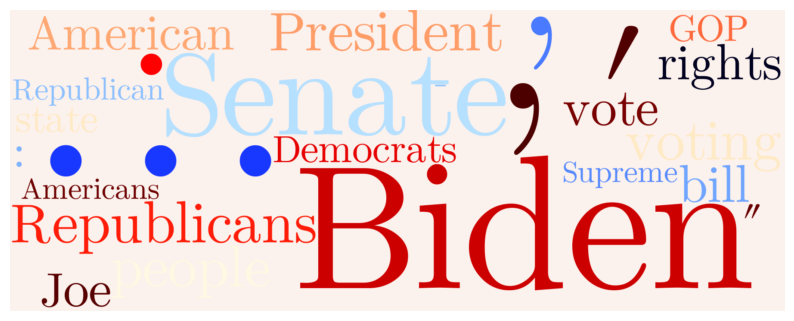

7 [('Russian', 203871), ('…', 201507), ('Ukraine', 144988), ('Russia', 114442), ('Ukrainian', 85900), ('Putin', 77809), ('.', 58073), ('war', 55154), ('President', 54673), (',', 54287), ('’', 53599), ('-', 52046), ("'", 49377), ('people', 49347), ('says', 48869), ('"', 48238), ('U..', 43469), ('Biden', 43169), ('military', 42961), ('“', 36994), ('Ukraine.', 35823), ('@KyivIndependent:', 34718), ('BREAKING:', 32217), ('#Ukraine', 31524), ('invasion', 31245)]


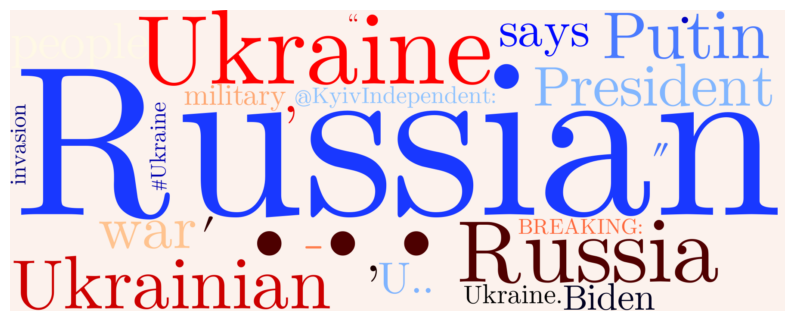

6 [('-', 114261), ('…', 81159), ("'", 53464), ('.', 49034), ('snow', 46520), ('near', 31723), ('via', 30253), ('across', 30145), (',', 28934), ('weather', 28020), ('Warning', 27649), ('tornado', 27141), ('Check', 26641), ('PM', 26602), (':', 24985), ('storm', 24562), ('#NowPlaying', 22968), ('’', 22257), ('!', 21993), ('fire', 21806), ('morning', 20838), ('County', 20437), ('Tornado', 20406), ('artwork', 20252), ('rain', 18759)]


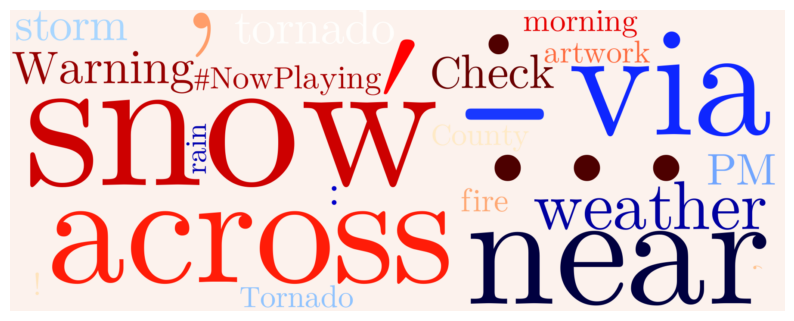

9 [('#', 47957), ('.', 26697), ('!', 22836), ('-', 22127), ('…', 19869), (':', 19582), ("'", 18071), ('Please', 17021), ('🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡', 16037), ('’', 15428), ('Thank', 12361), ('Report:', 11962), ('Incident', 11948), ('CHP', 11935), ('2022', 11648), ('@KeithOlbermann:', 11261), (',', 10338), ('Traffic', 9094), ('🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡🤡', 8554), ('🟩🟩🟩🟩🟩', 8283), ('Wordle', 8270), ('via', 8016), ('help', 7824), ('Thanks', 7753), ('2', 7730)]


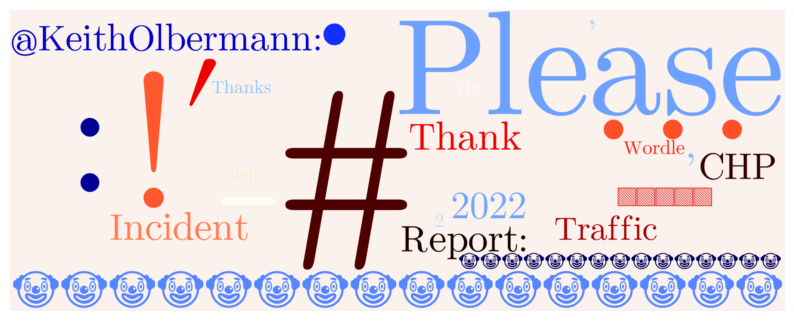

1 [('de', 67704), ('la', 32033), ('en', 24976), ('que', 20539), ('el', 17470), ('un', 11588), ('-', 11348), ('del', 9279), ('magnitude', 8844), ('#earthquake.', 8830), ('para', 8743), ('km', 8498), ('los', 8475), ('@QuakesToday:', 8127), ('…', 7829), ('con', 7676), ('se', 7559), ('le', 6631), ('por', 6550), ('La', 6328), ('.', 6277), ('las', 6261), ('es', 6252), ('una', 6101), ('e', 5633)]


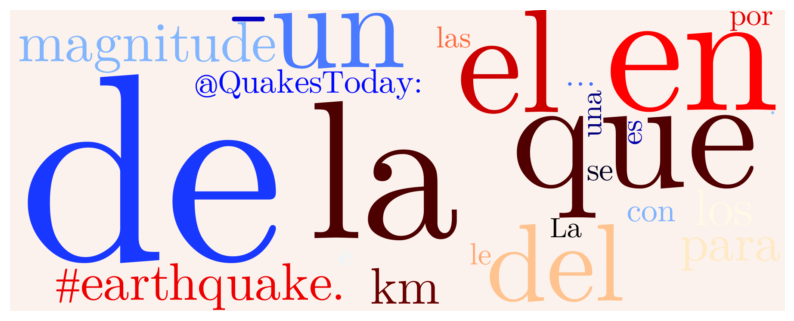

CPU times: user 16 s, sys: 1.1 s, total: 17.1 s
Wall time: 14.9 s


(array([3, 2, 0, 5, 8, 4, 7, 6, 9, 1]), None)

In [60]:
%%time
top_index, tw = show_output(gsdmm_model_all_basic_preproc_draft)
print("=================")
for cluster in top_index:
    draw_wordcloud(gsdmm_model_all_basic_preproc_draft, cluster, 25)
    
top_index, tw

##

In [67]:
%%time

# Remove mentions

def pre_process_2(this_text):
    return Modify(this_text).res(RE_HTML_ENTITIES).res(RE_HTTP_LINKS).res(RE_REMOVEWORDS).res(RE_MENTIONS).res(r"[^\w\s]").res(r"\s+").value()

def process_raw_doc_list_2(identifier, text_list, K):
    tk = TimeKeeper("basic-pre-process")
    results = [pre_process_2(tweet_text) if type(tweet_text) is str else tweet_text for tweet_text in text_list]

    tk.next("split into tokens")
    text_tokens = [ doc.split() if type(doc) is str else [] for doc in results ]

    # create dictionary of all words in all documents
    tk.next("create dictionary")
    dictionary = gensim.corpora.Dictionary(text_tokens)

    # filter extreme cases out of dictionary
    tk.next("filter extremes")
    dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)

    # create variable containing length of dictionary/vocab
    vocab_length = len(dictionary)

    # create BOW dictionary
    tk.next("create bag of words dictionary")
    bow_corpus = [dictionary.doc2bow(doc) for doc in text_tokens]

    # initialize GSDMM
    gsdmm = MovieGroupProcess(K=K, alpha=0.1, beta=0.3, n_iters=15)

    # fit GSDMM model
    tk.next("fit GSDMM model")
    y = gsdmm.fit(text_tokens, vocab_length)

    tk.next("save model file")
    gsdmm.save(f"./models/gsdmm_model_{identifier}")
    
    tk.done()
    
    return gsdmm



CPU times: user 15 µs, sys: 0 ns, total: 15 µs
Wall time: 19.6 µs


Number of documents per topic : [11581 10517  3393 12172  4583  7947 12445  7406 12165 17791]
Most important clusters (by number of text_tokens inside): [9 6 3 8 0 1 5 7 4 2]

Cluster 9 : [('Putin', 2021), ('Trump', 1882), ('Ukraine', 1478), ('Biden', 1378), ('people', 1117), ('Russia', 959), ('President', 775), ('war', 660), ('Russian', 650), ('right', 583), ('Joe', 547), ('world', 533), ('think', 498), ('want', 488), ('America', 481), ('Republicans', 437), ('country', 416), ('going', 405), ('media', 399), ('said', 386)]

Cluster 6 : [('people', 488), ('Thank', 421), ('work', 384), ('great', 343), ('good', 328), ('much', 304), ('share', 283), ('story', 275), ('Thanks', 271), ('many', 269), ('book', 263), ('year', 258), ('news', 258), ('love', 256), ('best', 256), ('read', 252), ('years', 247), ('life', 247), ('want', 217), ('think', 216)]

Cluster 3 : [('love', 820), ('Good', 801), ('morning', 590), ('Happy', 459), ('night', 385), ('heart', 372), ('beautiful', 371), ('life', 330), ('G

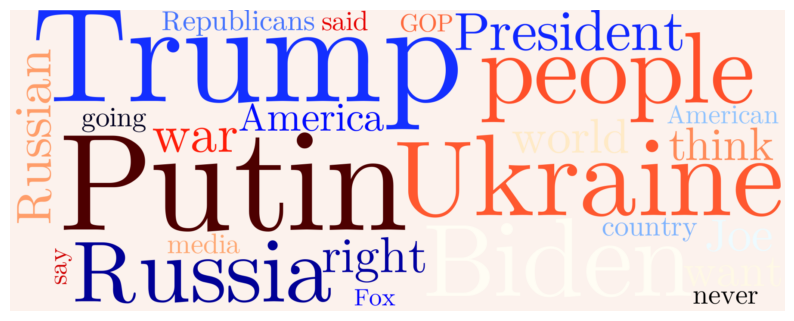

6 [('people', 488), ('Thank', 421), ('work', 384), ('great', 343), ('good', 328), ('much', 304), ('share', 283), ('story', 275), ('Thanks', 271), ('many', 269), ('book', 263), ('year', 258), ('news', 258), ('love', 256), ('best', 256), ('read', 252), ('years', 247), ('life', 247), ('want', 217), ('think', 216), ('back', 207), ('really', 201), ('help', 200), ('week', 197), ('going', 195)]


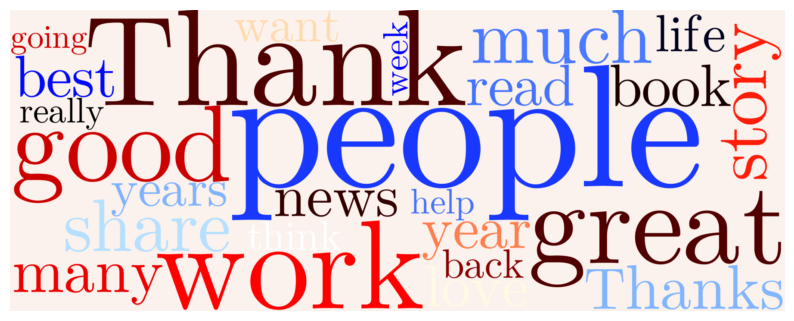

3 [('love', 820), ('Good', 801), ('morning', 590), ('Happy', 459), ('night', 385), ('heart', 372), ('beautiful', 371), ('life', 330), ('GAY', 330), ('nature', 328), ('friends', 305), ('Thank', 265), ('world', 250), ('little', 246), ('good', 242), ('everyone', 239), ('NaturePhotography', 235), ('dog', 220), ('always', 215), ('poetry', 209), ('happy', 205), ('dear', 203), ('words', 200), ('way', 197), ('light', 186)]


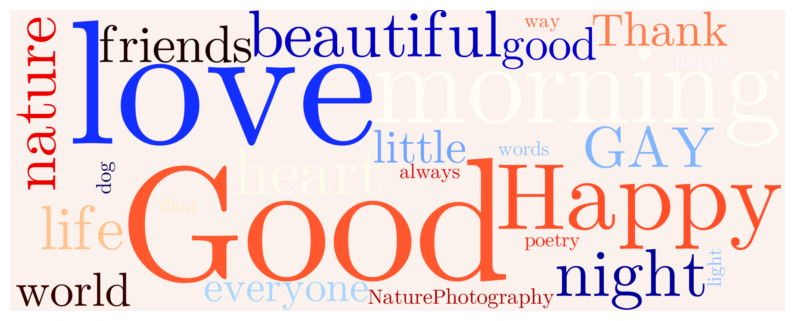

8 [('Biden', 573), ('bill', 511), ('Jackson', 478), ('people', 471), ('year', 439), ('Senate', 435), ('state', 409), ('school', 399), ('Florida', 398), ('vote', 385), ('Republicans', 379), ('Court', 368), ('Judge', 351), ('Supreme', 349), ('law', 331), ('rights', 301), ('Texas', 301), ('voting', 300), ('Republican', 297), ('000', 295), ('public', 291), ('Brown', 289), ('Gay', 287), ('Black', 286), ('GOP', 280)]


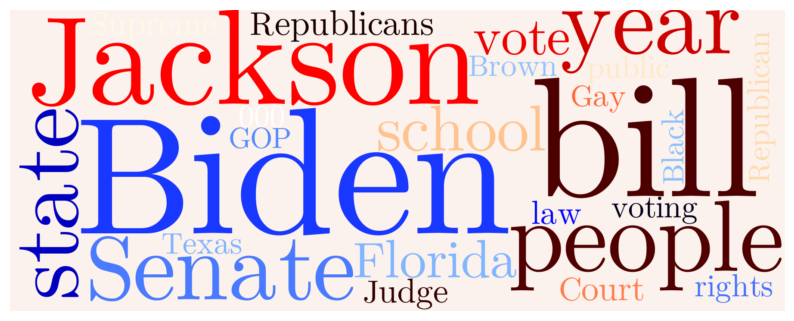

0 [('Trump', 2989), ('6', 820), ('Jan', 580), ('Donald', 571), ('House', 517), ('Thomas', 503), ('election', 412), ('Republican', 402), ('Biden', 392), ('says', 392), ('President', 381), ('GOP', 350), ('January', 336), ('BREAKING', 332), ('White', 331), ('said', 286), ('Greene', 283), ('1', 270), ('former', 265), ('Committee', 263), ('committee', 258), ('Republicans', 256), ('Taylor', 255), ('Marjorie', 252), ('Justice', 251)]


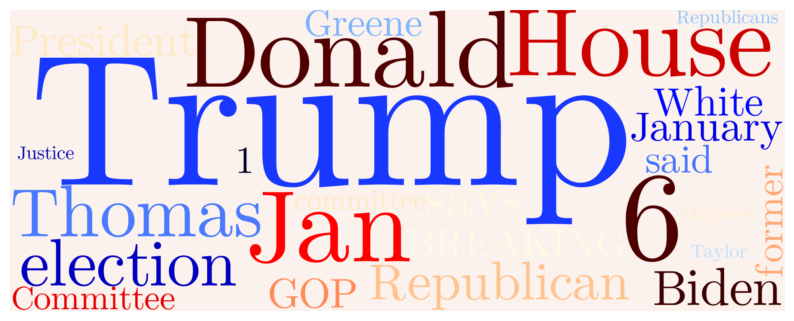

1 [('Ukraine', 2313), ('Russian', 1802), ('Russia', 1593), ('Ukrainian', 825), ('Putin', 686), ('war', 583), ('Kyiv', 463), ('U', 435), ('BREAKING', 397), ('people', 381), ('says', 354), ('military', 344), ('President', 330), ('city', 275), ('nuclear', 272), ('said', 271), ('invasion', 253), ('forces', 250), ('killed', 242), ('Biden', 239), ('Mariupol', 229), ('support', 214), ('world', 202), ('NATO', 201), ('000', 196)]


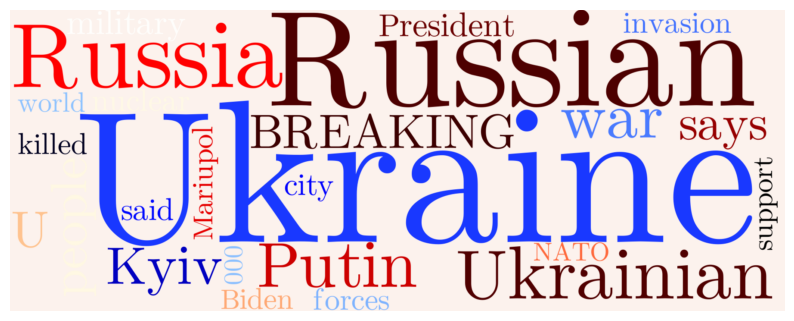

5 [('COVID', 759), ('2', 524), ('19', 494), ('1', 409), ('photo', 294), ('people', 282), ('pandemic', 229), ('pictures', 220), ('Omicron', 219), ('home', 213), ('help', 205), ('photos', 200), ('vaccine', 199), ('year', 198), ('Covid', 196), ('years', 188), ('many', 182), ('family', 180), ('3', 178), ('5', 175), ('gas', 168), ('use', 161), ('000', 157), ('high', 157), ('COVID19', 157)]


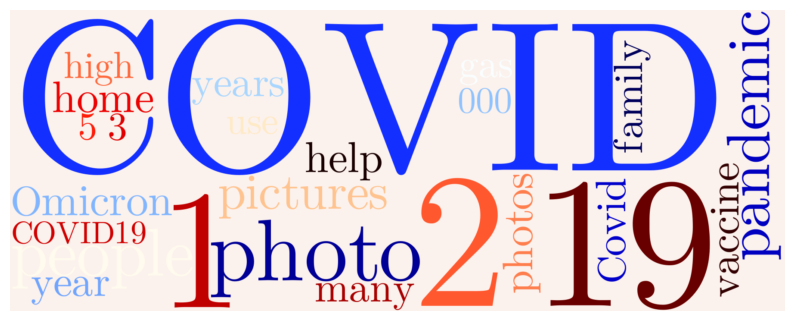

7 [('morning', 461), ('snow', 416), ('Alabama', 348), ('sunset', 263), ('County', 257), ('2', 248), ('tornado', 232), ('tonight', 231), ('Beach', 209), ('hiking', 203), ('across', 196), ('1', 196), ('near', 189), ('3', 187), ('storm', 177), ('Park', 177), ('weather', 172), ('Sunset', 166), ('Snow', 155), ('rain', 154), ('night', 153), ('evening', 152), ('severe', 152), ('winter', 151), ('National', 143)]


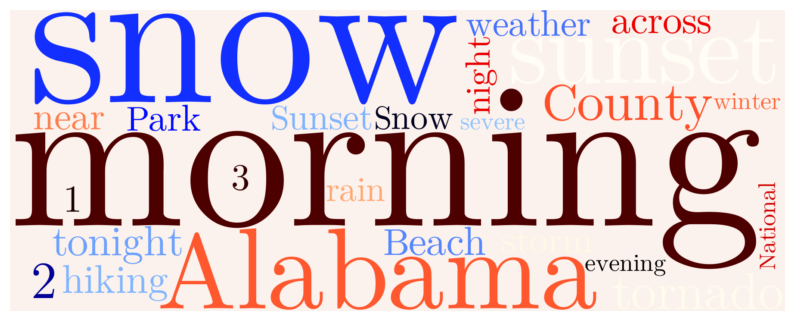

4 [('via', 154), ('1', 117), ('2', 115), ('2022', 103), ('3', 91), ('LIAR', 83), ('CA', 68), ('Good', 63), ('American', 60), ('TrumpCrimeFamilyForPrison', 60), ('United', 59), ('War', 59), ('USA', 56), ('States', 56), ('action', 53), ('Music', 51), ('killed', 49), ('おはようございます', 47), ('4', 47), ('photography', 47), ('World', 46), ('Traitor', 46), ('Travel', 46), ('Twitter', 45), ('dies', 45)]


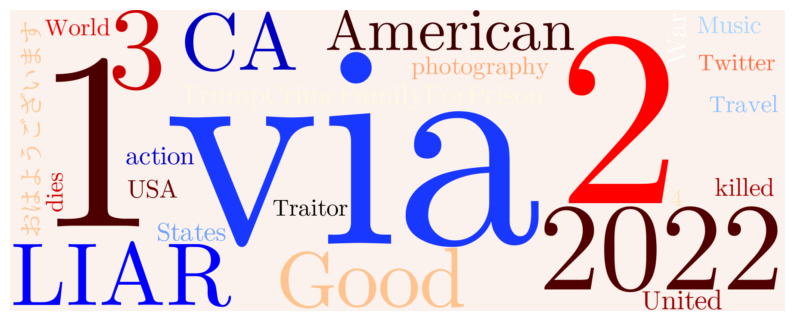

2 [('de', 692), ('la', 366), ('que', 256), ('en', 214), ('un', 180), ('el', 157), ('おはようございます', 155), ('l', 146), ('se', 121), ('es', 120), ('le', 108), ('et', 92), ('à', 92), ('La', 91), ('para', 88), ('e', 86), ('te', 82), ('los', 71), ('del', 70), ('una', 70), ('une', 69), ('les', 68), ('por', 68), ('_', 62), ('con', 62)]


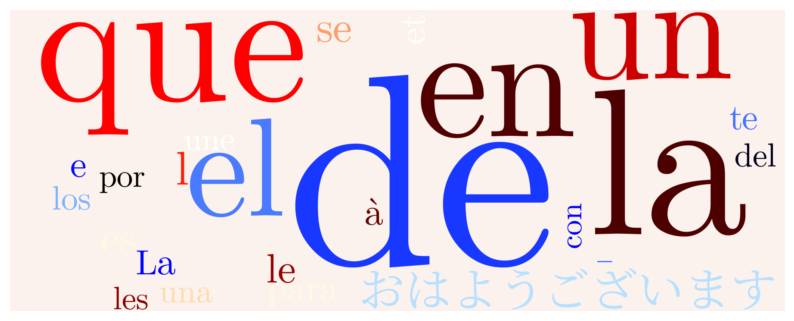

CPU times: user 10.7 s, sys: 1.16 s, total: 11.8 s
Wall time: 9.71 s


(array([9, 6, 3, 8, 0, 1, 5, 7, 4, 2]), None)

In [63]:
%%time

gsdmm_model_all_basic_preproc_nomentions_10 = process_raw_doc_list_2("all_basic_preproc_nomentions", tdf.iloc[:100000]["text"].values, 10)

top_index, tw = show_output(gsdmm_model_all_basic_preproc_nomentions)
print("=================")
for cluster in top_index:
    draw_wordcloud(gsdmm_model_all_basic_preproc_nomentions, cluster, 25)
    
top_index, tw

basic-pre-process...
basic-pre-process done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=11.665478577997419 seconds
split into tokens...
split into tokens done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=0.10473486001137644 seconds
create dictionary...
create dictionary done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=1.192316900996957 seconds
filter extremes...
filter extremes done.  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=0.10376309001003392 seconds
create bag of words dictionary...
create bag of words dictionary done.  ...  ...  ...  ...  ...  ...  ...  ... T=0.6148998139979085 seconds
fit GSDMM model...
In stage 0: transferred 89394 clusters with 20 clusters populated
In stage 1: transferred 66617 clusters with 20 clusters populated
In stage 2: transferred 49814 clusters with 20 clusters populated
In stage 3: transferred 39121 clusters with 20 clusters populated
In stage 4: transferred 33646 clusters with 20 clusters populated
In s

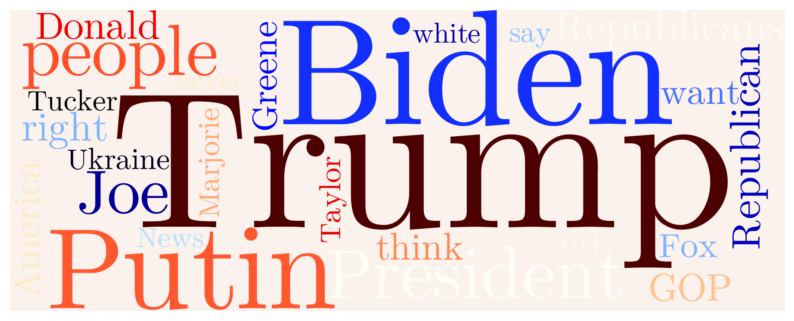

10 [('Ukraine', 2041), ('Putin', 1620), ('Russia', 1501), ('Russian', 832), ('war', 750), ('President', 619), ('Trump', 614), ('Biden', 591), ('world', 398), ('people', 382), ('U', 358), ('NATO', 328), ('Ukrainian', 287), ('support', 277), ('invasion', 271), ('country', 219), ('United', 218), ('said', 217), ('Zelensky', 212), ('military', 209), ('sanctions', 208), ('says', 203), ('States', 180), ('democracy', 172), ('American', 169)]


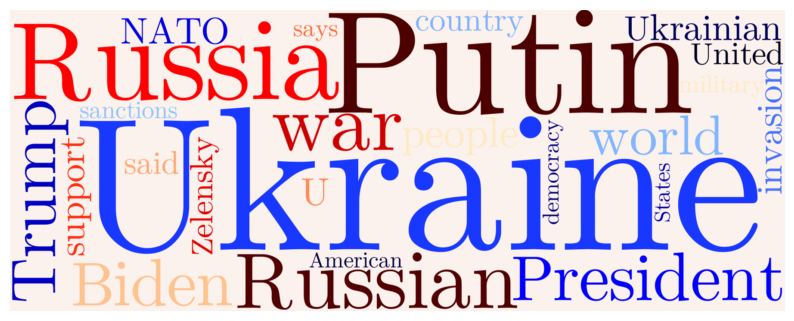

17 [('Thank', 352), ('much', 349), ('people', 317), ('love', 271), ('photo', 262), ('good', 222), ('best', 211), ('help', 210), ('even', 204), ('way', 203), ('life', 201), ('really', 196), ('think', 196), ('read', 192), ('story', 190), ('many', 184), ('work', 182), ('always', 182), ('pictures', 182), ('never', 173), ('something', 171), ('photos', 170), ('take', 166), ('family', 162), ('Thanks', 157)]


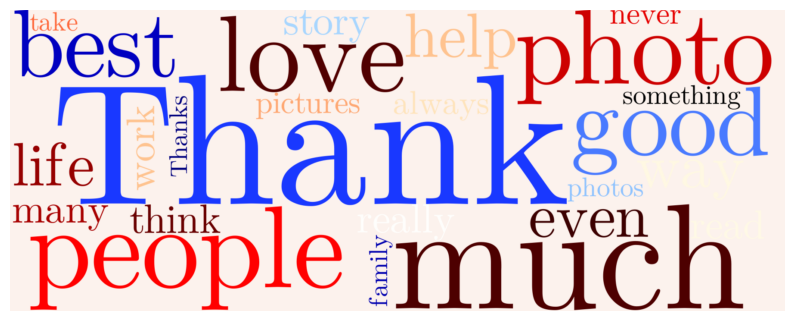

14 [('Jackson', 530), ('Senate', 440), ('Court', 436), ('bill', 407), ('Supreme', 402), ('Judge', 379), ('Florida', 344), ('Republicans', 319), ('GOP', 306), ('vote', 299), ('Brown', 297), ('rights', 296), ('Republican', 295), ('voting', 292), ('Ketanji', 277), ('Biden', 270), ('state', 234), ('people', 230), ('Black', 223), ('DeSantis', 221), ('right', 216), ('Texas', 212), ('Democrats', 197), ('abortion', 189), ('House', 186)]


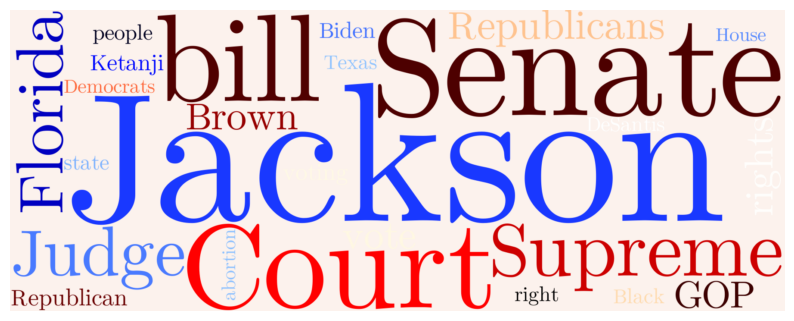

18 [('Trump', 2358), ('6', 789), ('Jan', 557), ('Donald', 442), ('Thomas', 436), ('House', 396), ('January', 335), ('election', 330), ('says', 277), ('BREAKING', 257), ('White', 253), ('committee', 245), ('Committee', 244), ('President', 242), ('former', 222), ('Justice', 190), ('1', 189), ('Biden', 187), ('Ginni', 186), ('Capitol', 185), ('Clarence', 184), ('DOJ', 183), ('6th', 180), ('documents', 177), ('Republican', 162)]


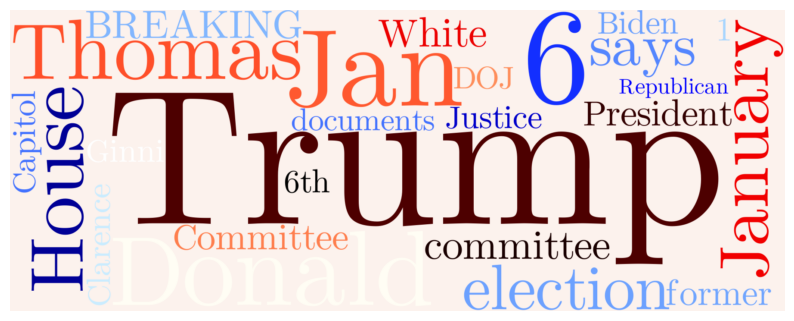

4 [('Good', 968), ('morning', 663), ('Happy', 561), ('nature', 296), ('friends', 275), ('beautiful', 252), ('NaturePhotography', 246), ('love', 243), ('everyone', 231), ('night', 223), ('Thank', 191), ('Morning', 190), ('dear', 180), ('good', 176), ('evening', 175), ('happy', 164), ('photography', 151), ('weekend', 148), ('great', 133), ('friend', 124), ('Beautiful', 119), ('week', 117), ('Friday', 116), ('birds', 115), ('little', 113)]


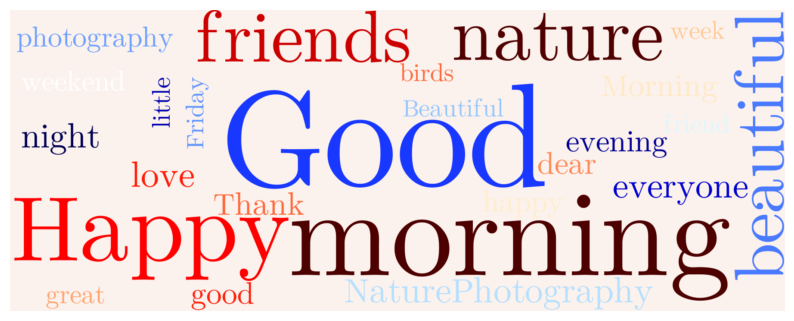

15 [('old', 372), ('year', 270), ('years', 248), ('people', 246), ('Ukraine', 244), ('home', 242), ('dog', 230), ('Ukrainian', 191), ('help', 187), ('man', 168), ('woman', 145), ('family', 143), ('2', 142), ('Kyiv', 134), ('life', 129), ('ago', 129), ('two', 126), ('children', 123), ('dogs', 122), ('Please', 118), ('cat', 110), ('shelter', 109), ('find', 105), ('3', 104), ('said', 99)]


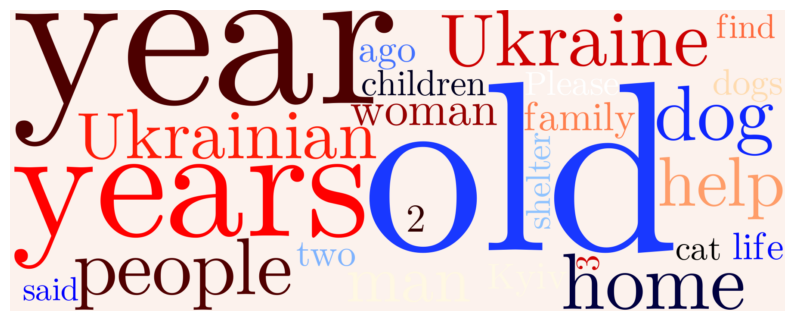

0 [('Biden', 491), ('000', 317), ('year', 280), ('million', 257), ('gas', 230), ('1', 218), ('people', 208), ('years', 197), ('2', 181), ('jobs', 180), ('Americans', 170), ('prices', 161), ('3', 159), ('President', 158), ('American', 157), ('work', 151), ('pay', 151), ('oil', 149), ('5', 138), ('Trump', 137), ('help', 135), ('U', 134), ('Joe', 132), ('care', 132), ('6', 119)]


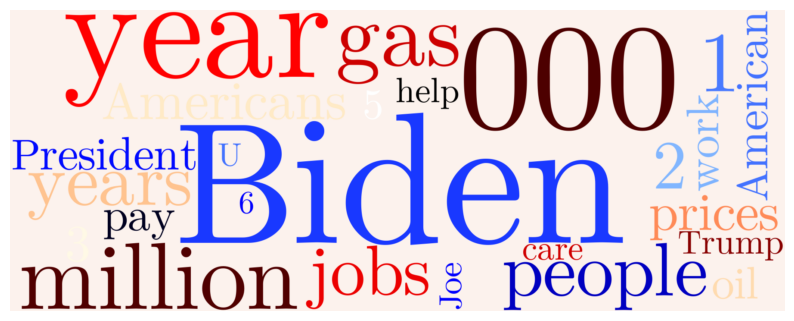

12 [('work', 204), ('hiking', 199), ('great', 191), ('share', 173), ('Join', 156), ('news', 155), ('SPJ', 154), ('2022', 147), ('join', 146), ('people', 145), ('women', 140), ('Thank', 139), ('Great', 124), ('team', 122), ('Thanks', 121), ('journalists', 116), ('good', 116), ('learn', 110), ('Black', 109), ('Women', 103), ('week', 102), ('talk', 100), ('community', 100), ('safety', 99), ('job', 97)]


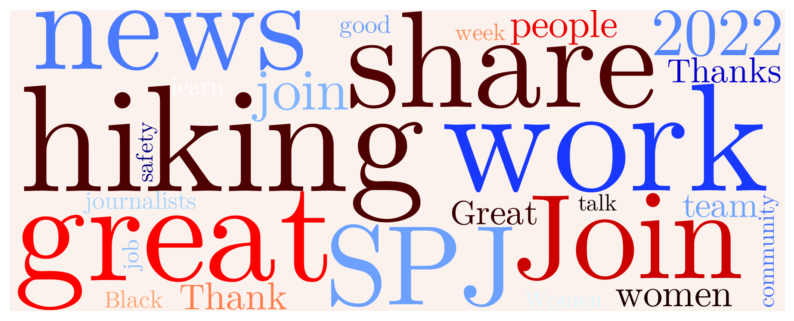

11 [('snow', 400), ('morning', 397), ('Alabama', 347), ('sunset', 239), ('County', 229), ('tornado', 228), ('tonight', 220), ('near', 201), ('across', 185), ('storm', 180), ('weather', 167), ('rain', 160), ('2', 159), ('Snow', 156), ('Beach', 155), ('Sunset', 151), ('severe', 151), ('1', 150), ('NYC', 140), ('night', 137), ('evening', 135), ('3', 129), ('winter', 128), ('afternoon', 126), ('Lake', 126)]


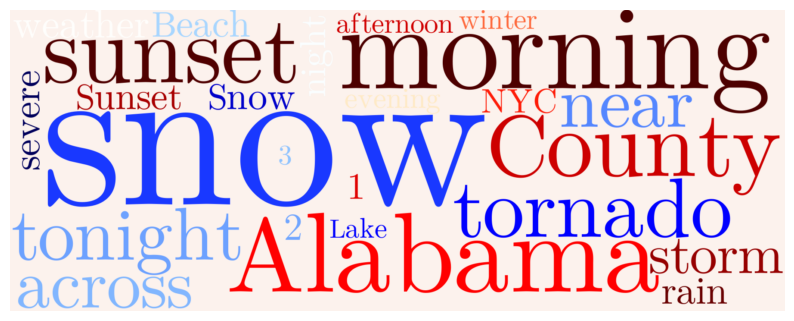

3 [('people', 369), ('GAY', 345), ('Trudeau', 222), ('right', 207), ('Canadian', 206), ('truckers', 190), ('Canada', 176), ('Ottawa', 163), ('anti', 146), ('government', 145), ('Convoy', 139), ('media', 135), ('Rogan', 130), ('Joe', 128), ('convoy', 124), ('freedom', 122), ('police', 118), ('Freedom', 116), ('protest', 112), ('BREAKING', 108), ('Spotify', 104), ('mandates', 95), ('American', 94), ('going', 93), ('trucker', 92)]


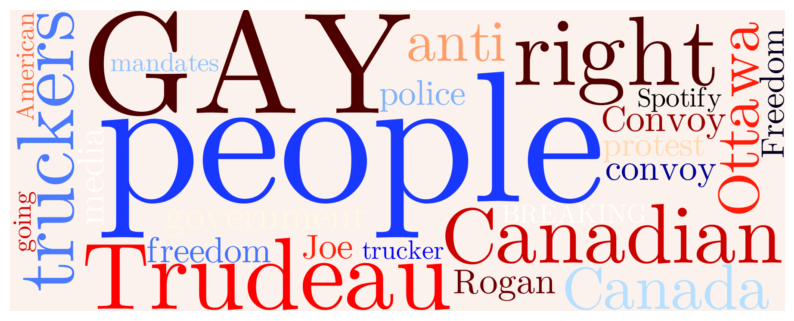

16 [('Russian', 1257), ('Ukraine', 1201), ('Russia', 715), ('Ukrainian', 563), ('Kyiv', 326), ('war', 266), ('Putin', 252), ('military', 234), ('forces', 208), ('says', 202), ('Mariupol', 199), ('city', 192), ('BREAKING', 191), ('nuclear', 175), ('people', 166), ('U', 166), ('killed', 165), ('Russians', 150), ('troops', 130), ('invasion', 118), ('000', 117), ('Ukrainians', 111), ('said', 109), ('Kharkiv', 107), ('soldiers', 107)]


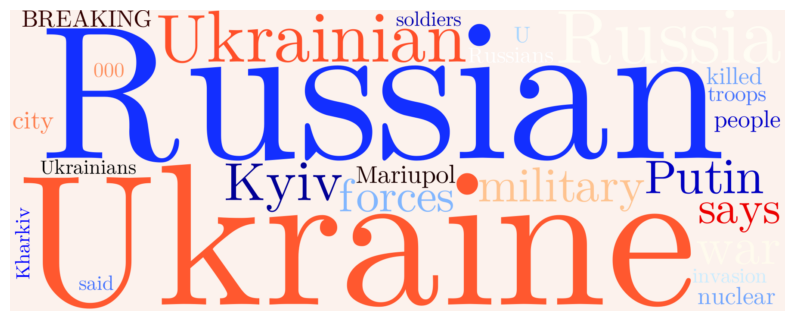

13 [('COVID', 829), ('19', 494), ('2', 392), ('people', 297), ('vaccine', 234), ('pandemic', 230), ('Covid', 226), ('Omicron', 221), ('1', 215), ('Gay', 170), ('mask', 167), ('COVID19', 158), ('health', 154), ('cases', 148), ('virus', 136), ('vaccinated', 126), ('data', 123), ('masks', 123), ('many', 122), ('study', 118), ('tests', 114), ('public', 113), ('also', 107), ('free', 106), ('Dr', 103)]


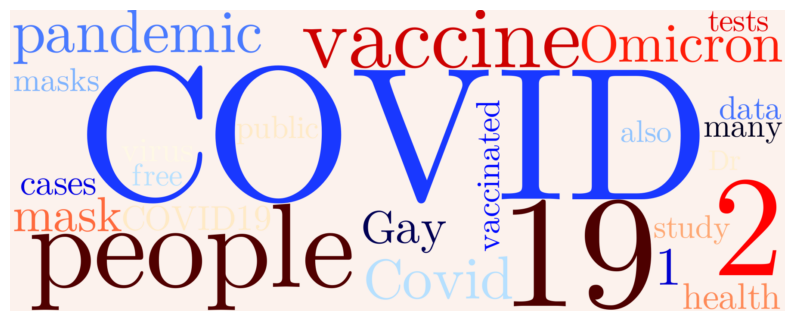

9 [('love', 437), ('heart', 297), ('poetry', 191), ('life', 173), ('night', 162), ('words', 158), ('light', 154), ('world', 152), ('eyes', 142), ('soul', 132), ('sky', 127), ('away', 124), ('haiku', 120), ('moon', 112), ('vss365', 107), ('beautiful', 102), ('sun', 101), ('poem', 96), ('way', 93), ('always', 92), ('dreams', 92), ('dark', 91), ('mind', 90), ('Love', 86), ('feel', 85)]


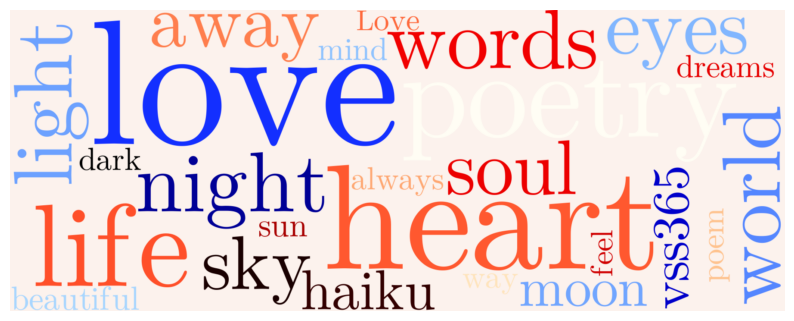

7 [('school', 189), ('County', 151), ('board', 142), ('San', 130), ('4', 105), ('years', 101), ('year', 99), ('Francisco', 99), ('Tina', 99), ('vote', 95), ('kids', 94), ('election', 92), ('state', 83), ('LIAR', 80), ('students', 77), ('meeting', 75), ('000', 73), ('members', 72), ('well', 72), ('police', 68), ('district', 68), ('3', 67), ('security', 67), ('student', 67), ('old', 66)]


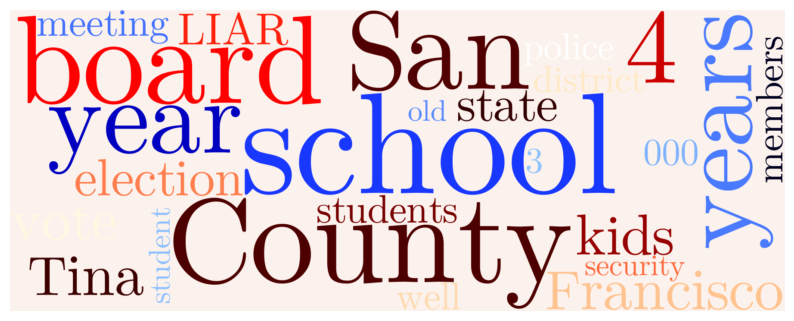

CPU times: user 12min 26s, sys: 1.81 s, total: 12min 28s
Wall time: 12min 25s


(array([19, 10, 17, 14, 18,  4, 15,  0, 12, 11,  3, 16, 13,  9,  7]), None)

In [66]:
%%time

gsdmm_model_all_basic_preproc_nomentions_20 = process_raw_doc_list_2("all_basic_preproc_nomentions", tdf.iloc[:100000]["text"].values, 20)

top_index, tw = show_output(gsdmm_model_all_basic_preproc_nomentions_20)
print("=================")
for cluster in top_index:
    draw_wordcloud(gsdmm_model_all_basic_preproc_nomentions_20, cluster, 25)
    
top_index, tw

In [75]:
%%time

from gensim.models import Phrases

# Add bigrams

def pre_process_3(this_text):
    return Modify(this_text).res(RE_HTML_ENTITIES).res(RE_HTTP_LINKS).res(RE_REMOVEWORDS).res(RE_MENTIONS).res(r"[^\w\s]").res(r"\s+").value()

def process_raw_doc_list_3(identifier, text_list, K):
    tk = TimeKeeper("basic-pre-process")
    results = [pre_process_3(tweet_text) if type(tweet_text) is str else tweet_text for tweet_text in text_list]

    tk.next("split into tokens")
    text_tokens = [ doc.split() if type(doc) is str else [] for doc in results ]
    
    tk.next("create bigrams")
    bigram_model = Phrases(text_tokens, min_count=1, threshold=1)
    bigram_docs = [bigram_model[doc] for doc in text_tokens]
    text_tokens = bigram_docs

    # create dictionary of all words in all documents
    tk.next("create dictionary")
    dictionary = gensim.corpora.Dictionary(text_tokens)

    # filter extreme cases out of dictionary
    tk.next("filter extremes")
    dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)

    # create variable containing length of dictionary/vocab
    vocab_length = len(dictionary)

    # create BOW dictionary
    tk.next("create bag of words dictionary")
    bow_corpus = [dictionary.doc2bow(doc) for doc in text_tokens]

    # initialize GSDMM
    gsdmm = MovieGroupProcess(K=K, alpha=0.1, beta=0.3, n_iters=15)

    # fit GSDMM model
    tk.next("fit GSDMM model")
    y = gsdmm.fit(text_tokens, vocab_length)

    tk.next("save model file")
    gsdmm.save(f"./models/gsdmm_model_{identifier}")
    
    tk.done()
    
    return gsdmm


CPU times: user 14 µs, sys: 0 ns, total: 14 µs
Wall time: 18.8 µs


In [79]:
%%time

gsdmm_model_all_basic_preproc_nomentions_bigrams_20 = process_raw_doc_list_3("all_basic_preproc_nomentions", tdf.iloc[:100000]["text"].values, 20)


basic-pre-process...
basic-pre-process done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=11.55203356698621 seconds
split into tokens...
split into tokens done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=0.10081982899282593 seconds
create bigrams...
create bigrams done.   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=2.342544753002585 seconds
create dictionary...
create dictionary done.     ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=1.0793725690018618 seconds
filter extremes...
filter extremes done.  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=0.19758363399887457 seconds
create bag of words dictionary...
create bag of words dictionary done.  ...  ...  ...  ...  ...  ...  ...  ... T=0.47436177800409496 seconds
fit GSDMM model...
In stage 0: transferred 86946 clusters with 20 clusters populated
In stage 1: transferred 64677 clusters with 20 clusters populated
In stage 2: transferred 57121 clusters with 20 clusters populated
In stage 3: 

Number of documents per topic : [5065 6328 4840 3840 5481 5636 4241 6106 5693 2719 5136 5463 4097 5706
 5318 2694 2353 7284 7127 4873]
Most important clusters (by number of text_tokens inside): [17 18  1  7 13  8  5  4 11 14 10  0 19  2  6]

Cluster 17 : [('Trump', 264), ('Marjorie_Taylor', 190), ('GAY_GAY', 164), ('Supreme_Court', 153), ('Donald_Trump', 146), ('Republicans', 138), ('Ketanji_Brown', 131), ('Jackson', 131), ('Biden', 130), ('Greene', 126), ('GOP', 119), ('Brown_Jackson', 118), ('Ted_Cruz', 117), ('Judge_Jackson', 113), ('think', 112), ('Putin', 107), ('Judge_Ketanji', 101), ('President_Biden', 91), ('right', 78), ('Republican', 77)]

Cluster 18 : [('Good_morning', 359), ('love', 185), ('Thank', 167), ('everyone', 151), ('friends', 124), ('people', 103), ('friend', 98), ('always', 96), ('Good_Morning', 94), ('life', 91), ('Good_night', 81), ('Love', 77), ('great', 75), ('beautiful', 75), ('hope', 75), ('Thanks', 70), ('Thank_much', 70), ('family', 70), ('Twitter', 69), (

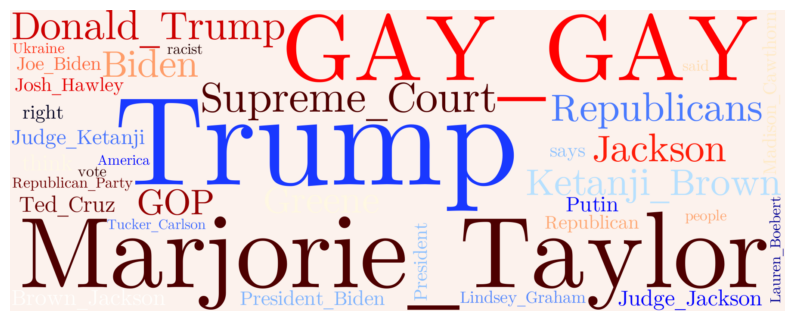

18 [('Good_morning', 359), ('love', 185), ('Thank', 167), ('everyone', 151), ('friends', 124), ('people', 103), ('friend', 98), ('always', 96), ('Good_Morning', 94), ('life', 91), ('Good_night', 81), ('Love', 77), ('great', 75), ('beautiful', 75), ('hope', 75), ('Thanks', 70), ('Thank_much', 70), ('family', 70), ('Twitter', 69), ('thank', 69), ('Yes', 68), ('good', 67), ('Jerry', 66), ('week', 63), ('way', 63), ('happy', 61), ('right', 58), ('world', 57), ('Ukraine', 55), ('going', 54), ('amazing', 53), ('well', 53), ('Beautiful', 51), ('Good_evening', 51), ('think', 50)]


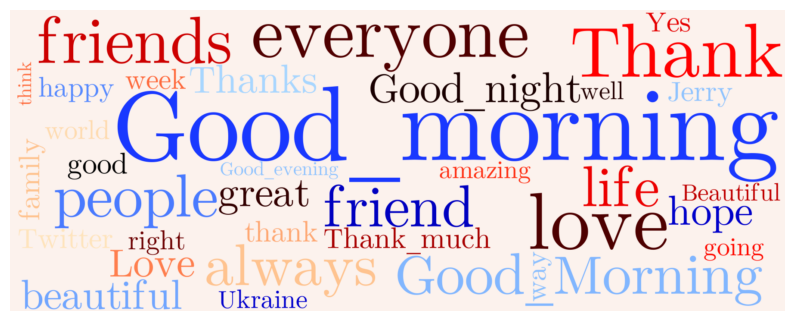

1 [('Ukraine', 411), ('Putin', 337), ('Russia', 334), ('Biden', 149), ('war', 121), ('NATO', 119), ('U', 110), ('Fox_News', 102), ('country', 96), ('United_States', 94), ('President_Biden', 93), ('Russian', 90), ('Trump', 88), ('people', 83), ('America', 80), ('world', 78), ('Tucker_Carlson', 74), ('Vladimir_Putin', 73), ('said', 71), ('Ukrainians', 68), ('West', 64), ('China', 64), ('propaganda', 60), ('Joe_Biden', 58), ('even', 57), ('think', 55), ('right', 55), ('says', 53), ('Kremlin', 53), ('want', 52), ('government', 51), ('Zelensky', 50), ('Americans', 49), ('invasion', 49), ('w', 48)]


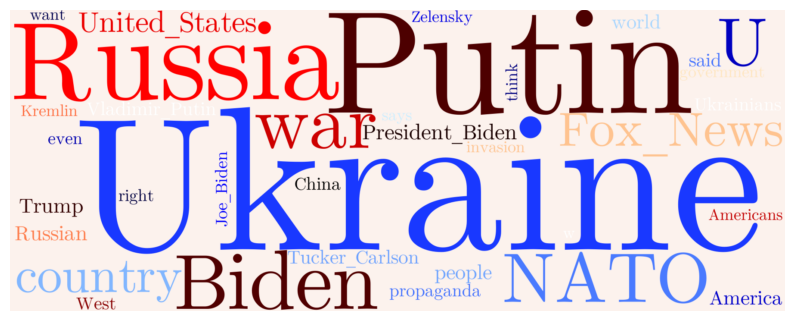

7 [('Trump', 432), ('Donald_Trump', 307), ('Jan_6', 249), ('White_House', 152), ('Ginni_Thomas', 139), ('January_6', 123), ('Clarence_Thomas', 113), ('Committee', 97), ('election', 90), ('House', 87), ('DOJ', 86), ('committee', 81), ('Hillary_Clinton', 80), ('January_6th', 78), ('Supreme_Court', 78), ('Rudy_Giuliani', 74), ('Mark_Meadows', 73), ('Hunter_Biden', 72), ('said', 68), ('1_6', 66), ('says', 65), ('documents', 60), ('BREAKING', 58), ('case', 58), ('investigation', 58), ('Pence', 58), ('Merrick_Garland', 56), ('w', 56), ('Jared_Kushner', 56), ('President_Trump', 54), ('trump', 54), ('records', 51), ('evidence', 50), ('th', 49), ('Ukraine', 48)]


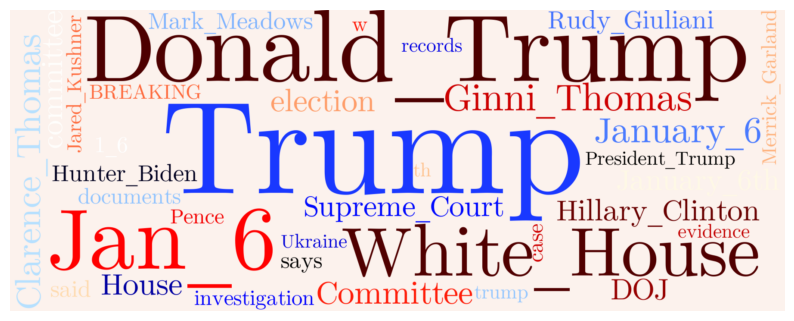

13 [('love', 202), ('heart', 152), ('night', 113), ('beautiful', 110), ('light', 103), ('words', 93), ('eyes', 93), ('nature', 88), ('sky', 83), ('moon', 81), ('sun', 81), ('life', 80), ('world', 78), ('soul', 77), ('dreams', 73), ('vss365', 73), ('flowers', 66), ('NaturePhotography', 66), ('winter', 62), ('stars', 60), ('dark', 57), ('trees', 56), ('long', 55), ('mind', 54), ('poetry', 53), ('beauty', 53), ('Love', 51), ('rain', 51), ('haiku', 51), ('away', 50), ('silence', 48), ('Good_morning', 48), ('dream', 47), ('wind', 46), ('hope', 46)]


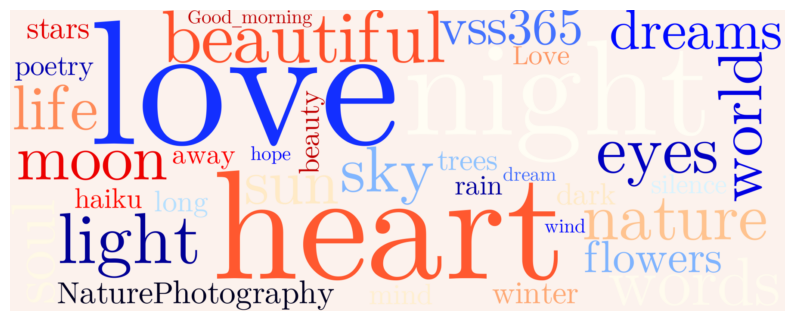

8 [('Trump', 171), ('Putin', 162), ('people', 120), ('right', 111), ('Ukraine', 104), ('Russia', 84), ('Republicans', 84), ('Biden', 76), ('America', 66), ('world', 63), ('GOP', 63), ('Donald_Trump', 60), ('go', 53), ('good', 53), ('power', 52), ('Joe_Biden', 50), ('every', 49), ('2', 48), ('want', 48), ('really', 48), ('country', 48), ('real', 47), ('Americans', 47), ('https', 47), ('must', 46), ('war', 45), ('history', 45), ('Twitter', 45), ('say', 45), ('never', 44), ('way', 44), ('anyone', 44), ('think', 43), ('remember', 43), ('w', 42)]


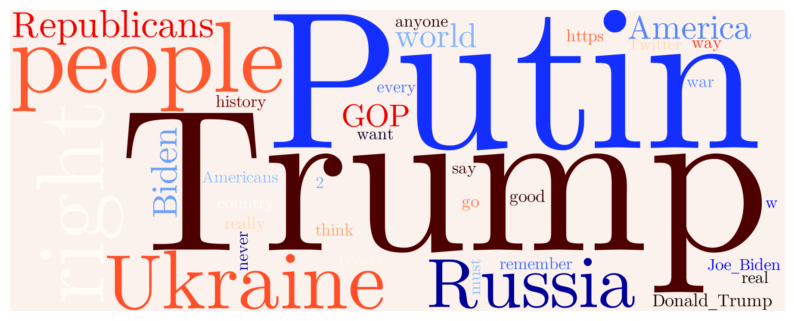

5 [('old', 133), ('dog', 115), ('love', 95), ('cat', 88), ('little', 87), ('help', 85), ('got', 82), ('2', 76), ('dogs', 72), ('mom', 68), ('baby', 63), ('looking', 62), ('found', 62), ('right', 54), ('life', 54), ('look', 53), ('go', 53), ('beautiful', 52), ('made', 52), ('home', 51), ('morning', 51), ('family', 51), ('happy', 51), ('sweet', 50), ('think', 49), ('shelter', 49), ('w', 48), ('watch', 48), ('people', 47), ('3', 47), ('really', 47), ('someone', 46), ('said', 45), ('much', 45), ('friend', 45)]


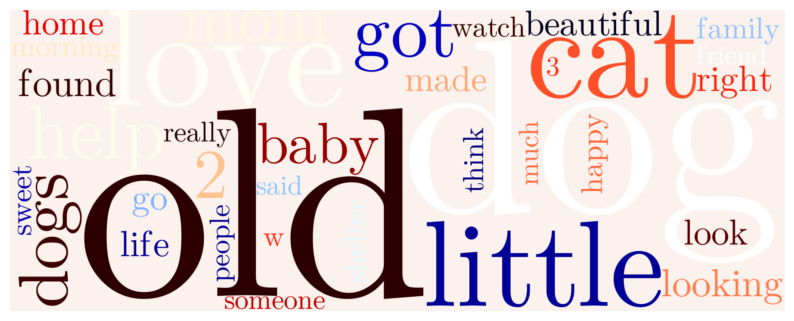

4 [('Ukraine', 467), ('Russia', 278), ('Russian', 187), ('Kyiv', 135), ('Putin', 135), ('Ukrainian', 133), ('Russians', 116), ('Mariupol', 107), ('war', 105), ('says', 83), ('city', 80), ('U', 77), ('people', 77), ('BREAKING', 72), ('military', 72), ('forces', 72), ('Wordle_Wordle', 70), ('Zelensky', 69), ('Russian_forces', 66), ('Kharkiv', 65), ('Ukrainians', 64), ('killed', 62), ('2', 59), ('said', 58), ('troops', 58), ('civilians', 53), ('Belarus', 53), ('th', 49), ('gay_gay', 45), ('soldiers', 44), ('Russian_troops', 44), ('attack', 42), ('Vladimir_Putin', 41), ('many', 40), ('Germany', 39)]


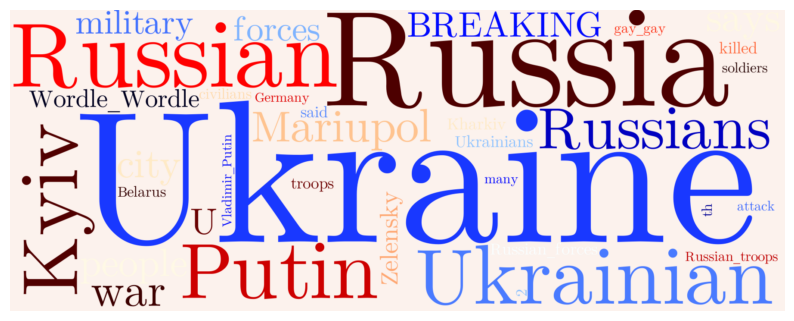

11 [('Thank', 113), ('work', 85), ('Thanks', 82), ('team', 80), ('story', 69), ('Join', 68), ('great', 66), ('book', 65), ('Check', 64), ('learn', 61), ('journalism', 61), ('looking', 57), ('2022', 57), ('share', 56), ('also', 55), ('testing', 55), ('Congrats', 51), ('news', 51), ('best', 50), ('journalists', 49), ('many', 49), ('important', 49), ('love', 48), ('read', 47), ('talk', 47), ('Great', 47), ('good', 47), ('awesome', 47), ('SPJ', 47), ('go', 46), ('Let', 46), ('week', 45), ('think', 45), ('part', 45), ('w', 44)]


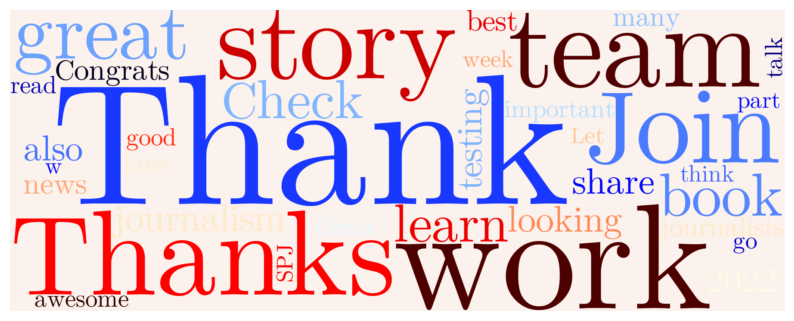

14 [('people', 97), ('Joe_Rogan', 81), ('Trump', 80), ('kids', 75), ('say', 64), ('says', 57), ('think', 55), ('right', 53), ('many', 53), ('want', 51), ('Trudeau', 51), ('Biden', 48), ('even', 48), ('government', 47), ('going', 44), ('read', 43), ('Canada', 42), ('person', 42), ('students', 42), ('said', 41), ('Yep', 41), ('school_board', 41), ('actually', 40), ('media', 40), ('meeting', 40), ('children', 39), ('also', 39), ('teachers', 39), ('mandates', 38), ('voters', 37), ('district', 37), ('board', 36), ('America', 36), ('Florida', 36), ('schools', 36)]


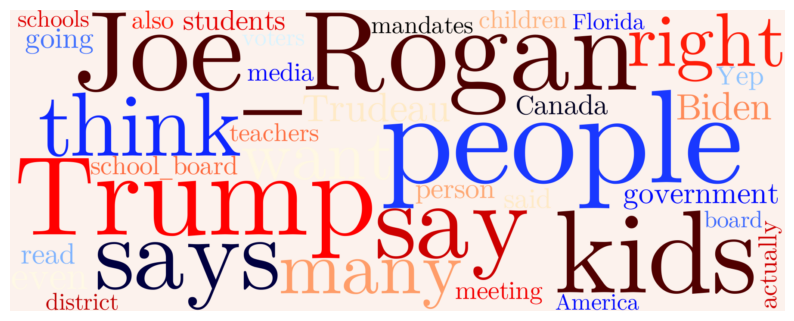

10 [('morning', 160), ('snow', 139), ('Alabama', 115), ('tonight', 109), ('sunset', 108), ('near', 95), ('Sunset', 85), ('Snow', 75), ('AL', 73), ('evening', 68), ('storm', 67), ('area', 62), ('video', 60), ('sunrise', 60), ('afternoon', 60), ('weather', 60), ('tornado', 59), ('night', 58), ('Beach', 52), ('view', 51), ('2', 50), ('rain', 50), ('photo', 48), ('right', 47), ('weekend', 47), ('Good_morning', 44), ('tomorrow', 44), ('north', 44), ('winter', 44), ('Beautiful', 42), ('Park', 42), ('alwx', 41), ('clouds', 41), ('south', 40), ('Charlotte', 40)]


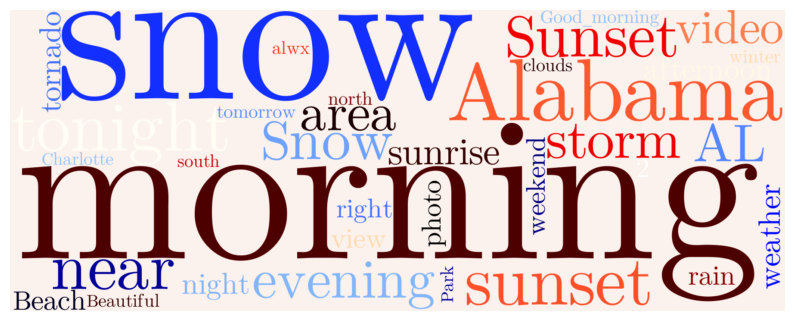

0 [('Joe_Biden', 98), ('Gay_Gay', 85), ('Biden', 84), ('year', 79), ('people', 76), ('America', 74), ('pay', 67), ('money', 61), ('work', 57), ('jobs', 57), ('gas_prices', 57), ('families', 56), ('Americans', 53), ('got', 47), ('much', 46), ('think', 46), ('country', 45), ('paid', 45), ('company', 44), ('true', 44), ('1', 43), ('going', 43), ('gas', 43), ('also', 41), ('pandemic', 40), ('China', 40), ('never', 40), ('inflation', 39), ('say', 38), ('job', 38), ('says', 37), ('President_Biden', 37), ('Facebook', 37), ('prices', 37), ('made', 36)]


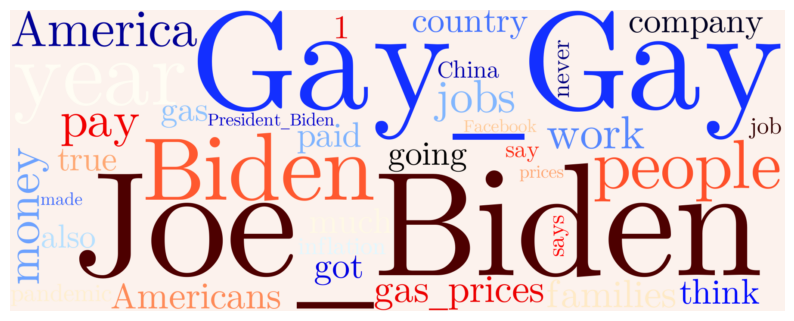

19 [('COVID_19', 236), ('COVID', 117), ('pandemic', 109), ('2', 100), ('1', 100), ('Omicron', 92), ('Covid', 87), ('vaccine', 80), ('data', 69), ('SARS_CoV', 68), ('U', 66), ('people', 62), ('COVID19', 62), ('yet', 61), ('PRO_AH', 60), ('study', 60), ('virus', 59), ('Hong_Kong', 57), ('cases', 54), ('3', 53), ('CDC', 53), ('says', 52), ('BA_2', 52), ('work', 51), ('also', 51), ('may', 50), ('deaths', 50), ('vaccines', 49), ('many', 48), ('w', 47), ('well', 46), ('use', 46), ('USA', 44), ('4', 44), ('vaccination', 44)]


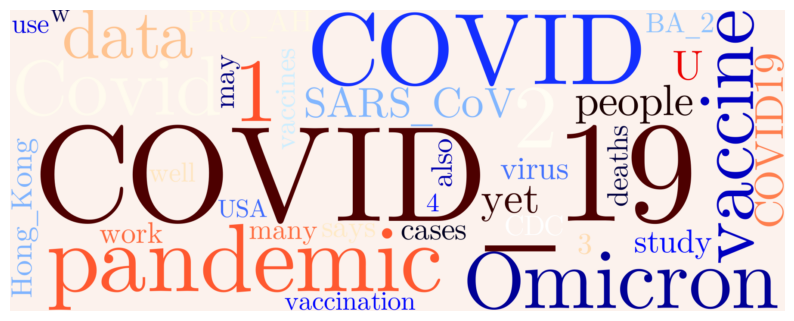

2 [('bill', 148), ('Supreme_Court', 94), ('vote', 92), ('Florida', 85), ('state', 80), ('Democrats', 79), ('law', 73), ('President_Biden', 70), ('Act', 69), ('Texas', 64), ('Senate', 64), ('Say_Gay', 61), ('support', 57), ('California', 57), ('legislation', 57), ('parents', 56), ('session', 52), ('GOP', 52), ('passed', 51), ('BREAKING', 51), ('Republican', 50), ('voting_rights', 50), ('Republicans', 49), ('voted', 48), ('students', 48), ('Virginia', 48), ('abortion', 47), ('school', 46), ('2022', 44), ('Ron_DeSantis', 43), ('copolitics', 41), ('House', 41), ('rights', 41), ('schools', 40), ('Colorado', 39)]


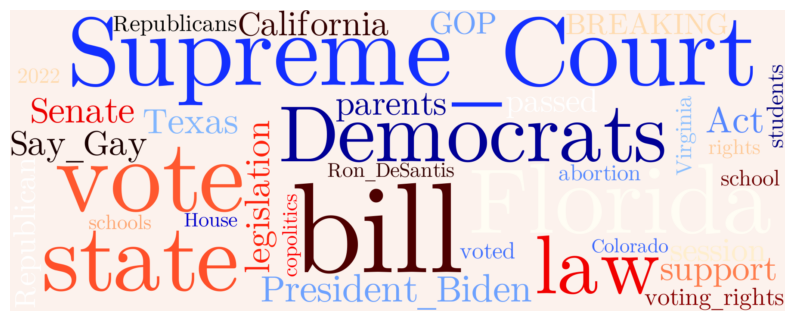

6 [('San_Francisco', 98), ('https', 65), ('California', 49), ('fire', 48), ('China', 47), ('old', 46), ('hiking', 46), ('students', 43), ('city', 39), ('home', 39), ('Park', 38), ('year', 37), ('National_Park', 37), ('Wisconsin', 34), ('week', 34), ('support', 34), ('Center', 33), ('Thanks', 32), ('2022', 31), ('w', 31), ('help', 30), ('Ukraine', 30), ('City', 30), ('event', 28), ('made', 28), ('found', 27), ('people', 27), ('near', 27), ('h', 27), ('family', 27), ('Minnesota', 27), ('Oregon', 27), ('community', 27), ('state', 26), ('htt', 26)]


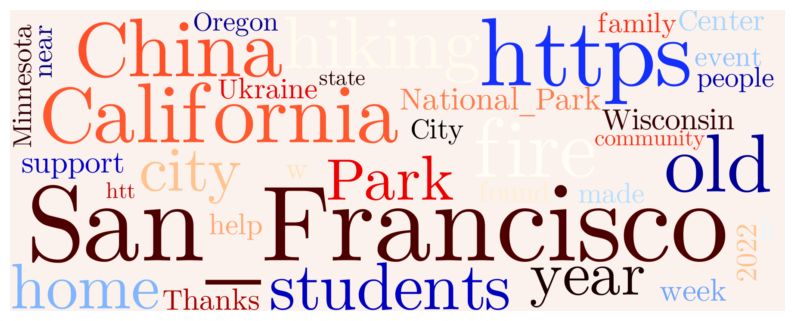

(array([17, 18,  1,  7, 13,  8,  5,  4, 11, 14, 10,  0, 19,  2,  6]), None)

In [80]:
top_index, tw = show_output(gsdmm_model_all_basic_preproc_nomentions_bigrams_20)
print("=================")
for cluster in top_index:
    draw_wordcloud(gsdmm_model_all_basic_preproc_nomentions_bigrams_20, cluster, 35)
    
top_index, tw

In [48]:
tdf["created_at"].min(), tdf["created_at"].max()

(Timestamp('2021-12-01 05:00:00+0000', tz='UTC'),
 Timestamp('2022-04-01 04:59:58+0000', tz='UTC'))

In [16]:
# Define a regular expression pattern for emojis
# emoji_pattern = re.compile(r'[\U0001F600-\U0001F64F\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF\U0001F700-\U0001F77F\U0001F780-\U0001F7FF\U0001F800-\U0001F8FF\U0001F900-\U0001F9FF\U0001FA00-\U0001FA6F\U0001FA70-\U0001FAFF\U0002600-\U00026FF\u2700-\u27BF]+', flags=re.UNICODE)
emoji_pattern = '\U0001F600-\U0001F64F\U0001F300-\U0001F5FF\U0001F680-\U0001F6FF\U0001F700-\U0001F77F\U0001F780-\U0001F7FF\U0001F800-\U0001F8FF\U0001F900-\U0001F9FF\U0001FA00-\U0001FA6F\U0001FA70-\U0001FAFF'#\U0002600-\U00026FF\u2700-\u27BF'

In [19]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [20]:
basic_preproc(tdf.iloc[6]["text"] + " sf in it this that the sdfi ")

'“’ never relevant journalists” says @Raquel_AmparoTV, President GM @CBS11. great hear positive message @dfwhispanic event recognizing leadership news industry. #journalism #dallas sf sdfi '

In [21]:
tdf.iloc[6]["text"] + " sf in it this that the sdfi "

'“We’ve never been more relevant as journalists” says @Raquel_AmparoTV, President &amp; GM @CBS11. It was great to hear her positive message at the @dfwhispanic event recognizing her leadership in the news industry. #journalism #dallas https://t.co/YKYxvozQq0 sf in it this that the sdfi '

In [22]:
Modify(tdf.iloc[6]["text"]+ " sf in it this that the sdfi ").rem(RE_STOPWORDS).value() #.res(r"\s+(the)\s+").value()

'“’ never   relevant  journalists” says @Raquel_AmparoTV, President &amp; GM @CBS11.   great  hear  positive message   @dfwhispanic event recognizing  leadership   news industry. #journalism #dallas https://.co/YKYxvozQq0 sf      sdfi '

In [23]:
basic_preproc(tdf.iloc[6]["text"]+ " sf in it this that the sdfi ")

'“’ never relevant journalists” says @Raquel_AmparoTV, President GM @CBS11. great hear positive message @dfwhispanic event recognizing leadership news industry. #journalism #dallas sf sdfi '

In [30]:
def pre_process(text_list):
    results = []
    for tweet_text in text_list:
        result = tweet_text
        # remove HTML Entities
        result = re.sub(r'&[A-Za-z0-9]+;', "", result)
        # remove twitter mentions
        result = re.sub("@\S+", "", result)
        # remove links
        result = re.sub(r"https?://\S+", "", result)
        # remove new lines, and tabs
        result = re.sub(r"[\n\t]", "", result)
        # remove punctuation characters
        result = re.sub(f"[{string.punctuation}]", "", result)
        # remove special words such as { RT }
        result = re.sub("^RT\s", "", result)
        # remove number islands
        result = re.sub(r"\s+\d+\s+", " ", result)
        # remove extra spaces
        result = re.sub(r"\s+", " ", result)
        # remove space at beginning
        result = re.sub(r"^ ", "", result)
        results.append(result)
    return results


def postag_to_argument(postag):
    if postag[0] == "V":
        return "v"
    elif postag[0] == "N":
        return "n"
    elif postag[0] == "J":
        return "a"
    elif postag[0] == "R":
        return "r"
    else:
        return "v"

    
def get_words(in_sentence, in_wnlemmatizer):
    # print(in_sentence)
    # Remove punctuation
    example_sentence_no_punct = in_sentence.translate(str.maketrans("", "", string.punctuation))
    # print(example_sentence_no_punct)
    # separate tokens
    word_tokens = word_tokenize(example_sentence_no_punct)
    # print(word_tokens)
    # tag Part of Speech
    postag = dict(nltk.pos_tag(word_tokens))
    # print(postag)
    # Lemmatize
    lemmas = [ in_wnlemmatizer.lemmatize(word, pos=postag_to_argument(postag[word])) for word in word_tokens ]
    # print(lemmas)
    # remove stop words
    filtered_lemmas = [w for w in lemmas if not w.lower() in english_stop_words]
    # print(filtered_word_tokens)
    return filtered_lemmas

In [31]:
def get_dict(text_list):
    # preprocess
    tk = TimeKeeper("pre-process")
    results = pre_process(text_list)
    
    # Initialize wordnet lemmatizer
    wnl = WordNetLemmatizer()

    # tokanize using the lemmatizer
    tk.next("lemmatize")
    text_tokens = [ get_words(doc, wnl) for doc in results ]
    text_tokens

    # create dictionary of all words in all documents
    tk.next("generate dictionary")
    dictionary = gensim.corpora.Dictionary(text_tokens)
    tk.done()
    
    return dictionary

In [32]:
this_dict = get_dict(tdf["text"].values)
this_dict

pre-process...
pre-process done.      ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=281.3683128760001 seconds
lemmatize...
lemmatize done.   ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=11563.424572311 seconds
generate dictionary...
generate dictionary done.   ...  ...  ...  ...  ...  ...  ...  ...  ...  ... T=3802.105523088001 seconds


In [34]:
this_dict.save("./gensim_models/main_dict")

In [35]:
this_dict.save_as_text("./gensim_models/main_dict_text")

In [36]:
def process_doc_list(identifier, text_list):
    # preprocess
    results = pre_process(text_list)
    
    # Initialize wordnet lemmatizer
    wnl = WordNetLemmatizer()

    # tokanize using the lemmatizer
    text_tokens = [ get_words(doc, wnl) for doc in results ]
    text_tokens

    # create dictionary of all words in all documents
    dictionary = gensim.corpora.Dictionary(text_tokens)

    # filter extreme cases out of dictionary
    dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)

    # create variable containing length of dictionary/vocab
    vocab_length = len(dictionary)

    # create BOW dictionary
    bow_corpus = [dictionary.doc2bow(doc) for doc in text_tokens]

    # initialize GSDMM
    gsdmm = MovieGroupProcess(K=10, alpha=0.1, beta=0.3, n_iters=15)

    # fit GSDMM model
    y = gsdmm.fit(text_tokens, vocab_length)

    gsdmm.save(f"./models/gsdmm_model_{identifier}")
    
    return gsdmm

In [ ]:
%%time
full_model = process_doc_list(f"{start_datetime}_to_{end_datetime}", tdf["text"].values)
full_model

In [39]:
start_datetime = tdf["created_at"].min()
start_datetime

Timestamp('2021-12-01 05:00:00+0000', tz='UTC')

In [44]:
full_model.save("./models/gsdmm_full_model")

In [40]:
end_datetime = tdf["created_at"].max() #start_datetime + datetime.timedelta(1)
end_datetime

Timestamp('2022-04-01 04:59:58+0000', tz='UTC')

In [30]:
%%time
this_model = process_doc_list(f"{start_datetime}_to_{end_datetime}", tdf[(start_datetime <= tdf["created_at"]) & (tdf["created_at"] < end_datetime)]["text"].values)
this_model

In stage 0: transferred 97898 clusters with 10 clusters populated
In stage 1: transferred 64951 clusters with 10 clusters populated
In stage 2: transferred 47191 clusters with 10 clusters populated
In stage 3: transferred 38488 clusters with 10 clusters populated
In stage 4: transferred 33380 clusters with 10 clusters populated
In stage 5: transferred 30952 clusters with 10 clusters populated
In stage 6: transferred 28951 clusters with 10 clusters populated
In stage 7: transferred 27867 clusters with 10 clusters populated
In stage 8: transferred 27383 clusters with 10 clusters populated
In stage 9: transferred 26966 clusters with 10 clusters populated
In stage 10: transferred 26376 clusters with 10 clusters populated
In stage 11: transferred 26348 clusters with 10 clusters populated
In stage 12: transferred 25956 clusters with 10 clusters populated
In stage 13: transferred 25650 clusters with 10 clusters populated
In stage 14: transferred 25594 clusters with 10 clusters populated
CPU t

In [31]:
print("done")

done


In [32]:
%%time
end_datetime = start_datetime + datetime.timedelta(2)
this_model = process_doc_list(f"{start_datetime}_to_{end_datetime}", tdf[(start_datetime <= tdf["created_at"]) & (tdf["created_at"] < end_datetime)]["text"].values)
this_model

In stage 0: transferred 191613 clusters with 10 clusters populated
In stage 1: transferred 132752 clusters with 10 clusters populated
In stage 2: transferred 96910 clusters with 10 clusters populated
In stage 3: transferred 77741 clusters with 10 clusters populated
In stage 4: transferred 65267 clusters with 10 clusters populated
In stage 5: transferred 57878 clusters with 10 clusters populated
In stage 6: transferred 53450 clusters with 10 clusters populated
In stage 7: transferred 51178 clusters with 10 clusters populated
In stage 8: transferred 49415 clusters with 10 clusters populated
In stage 9: transferred 48521 clusters with 10 clusters populated
In stage 10: transferred 47788 clusters with 10 clusters populated
In stage 11: transferred 47109 clusters with 10 clusters populated
In stage 12: transferred 46392 clusters with 10 clusters populated
In stage 13: transferred 45949 clusters with 10 clusters populated
In stage 14: transferred 45763 clusters with 10 clusters populated
CPU

In [33]:
%%time
end_datetime = start_datetime + datetime.timedelta(4)
this_model = process_doc_list(f"{start_datetime}_to_{end_datetime}", tdf[(start_datetime <= tdf["created_at"]) & (tdf["created_at"] < end_datetime)]["text"].values)
this_model

In stage 0: transferred 365815 clusters with 10 clusters populated
In stage 1: transferred 267285 clusters with 10 clusters populated
In stage 2: transferred 184030 clusters with 10 clusters populated
In stage 3: transferred 145126 clusters with 10 clusters populated
In stage 4: transferred 125457 clusters with 10 clusters populated
In stage 5: transferred 113347 clusters with 10 clusters populated
In stage 6: transferred 104315 clusters with 10 clusters populated
In stage 7: transferred 98466 clusters with 10 clusters populated
In stage 8: transferred 94259 clusters with 10 clusters populated


KeyboardInterrupt: 

In [34]:
%%time
end_datetime = start_datetime + datetime.timedelta(8)
this_model = process_doc_list(f"{start_datetime}_to_{end_datetime}", tdf[(start_datetime <= tdf["created_at"]) & (tdf["created_at"] < end_datetime)]["text"].values)
this_model

KeyboardInterrupt: 

In [114]:
df["created_at"].min(), df["created_at"].max()

(Timestamp('2021-12-01 05:00:00+0000', tz='UTC'),
 Timestamp('2022-04-01 04:59:58+0000', tz='UTC'))

In [152]:
start_datetime = df["created_at"].min()
start_datetime

Timestamp('2021-12-01 05:00:00+0000', tz='UTC')

In [153]:
shift = datetime.timedelta(1)
shift

datetime.timedelta(days=1)

In [154]:
window_list = [ [start_datetime + shift * i, start_datetime + shift * (i+1)] for i in range(45) ]
window_list

[[Timestamp('2021-12-01 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-02 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-02 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-03 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-03 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-04 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-04 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-05 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-05 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-06 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-06 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-07 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-07 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-08 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-08 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-09 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-09 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-10 05:00:00+0000', tz='UTC')],
 [Timestamp('2021-12-10 05:00:00+0000', tz='UTC'),
  Timestamp('2021-12-1

In [149]:
df[(window[0] <= df["created_at"]) & (df["created_at"] < window[1])]["text"].values

array(["While it's too early to know how the omicron variant could impact the Bay Area, local health officials urge residents not to panic and to get their vaccines and booster shots ahead of the winter holidays.\nhttps://t.co/jrIcevoZj1",
       'According to the Associated Press, the pop star was crowned the coveted title of "the right excellent" by Prime Minister Mia Mottley in Bridgetown.\n\nhttps://t.co/a7ahCCKlpt',
       'RT @EileenParkTV: https://t.co/qaVghYz2Ek', ...,
       "RT @kittensnotkids: @Well_Regulated_ @Phil_Lewis_ At least one kid caught it INSTANTLY, stands up ready to run. Hypervigilance shouldn't be…",
       'RT @HonorDSR: Climate change is here and it is killing people. It will kill more people. We must pull our heads out of the sand and address…',
       'RT @caslernoel: I think if two videos surface of a congresswoman using anti-Islamic slurs she should no longer be in congress. It’s an insu…'],
      dtype=object)

In [150]:
import multiprocessing

In [151]:
with multiprocessing.Pool(multiprocessing.cpu_count() - 1) as p:
    params_list = [[f"w{idx:02d}", df[(window[0] <= df["created_at"]) & (df["created_at"] < window[1])]["text"].values] for idx, window in enumerate(window_list)]
    results = p.starmap(process_doc_list, params_list)

In stage 0: transferred 1568 clusters with 10 clusters populated
In stage 0: transferred 1671 clusters with 10 clusters populated
In stage 1: transferred 1030 clusters with 10 clusters populated
In stage 1: transferred 1157 clusters with 10 clusters populated
In stage 2: transferred 894 clusters with 10 clusters populated
In stage 2: transferred 969 clusters with 10 clusters populated
In stage 0: transferred 2387 clusters with 10 clusters populated
In stage 3: transferred 836 clusters with 10 clusters populated
In stage 3: transferred 872 clusters with 10 clusters populated
In stage 0: transferred 2812 clusters with 10 clusters populated
In stage 4: transferred 810 clusters with 10 clusters populated
In stage 4: transferred 868 clusters with 10 clusters populated
In stage 1: transferred 1526 clusters with 10 clusters populated
In stage 5: transferred 797 clusters with 10 clusters populated
In stage 5: transferred 849 clusters with 10 clusters populated
In stage 1: transferred 1865 clus

In [143]:
%%time
day1 = process_doc_list()
day1

In stage 0: transferred 4238 clusters with 10 clusters populated
In stage 1: transferred 2695 clusters with 10 clusters populated
In stage 2: transferred 2206 clusters with 10 clusters populated
In stage 3: transferred 2011 clusters with 10 clusters populated
In stage 4: transferred 1903 clusters with 10 clusters populated
In stage 5: transferred 1764 clusters with 10 clusters populated
In stage 6: transferred 1752 clusters with 10 clusters populated
In stage 7: transferred 1766 clusters with 10 clusters populated
In stage 8: transferred 1768 clusters with 10 clusters populated
In stage 9: transferred 1746 clusters with 10 clusters populated
In stage 10: transferred 1747 clusters with 10 clusters populated
In stage 11: transferred 1662 clusters with 10 clusters populated
In stage 12: transferred 1704 clusters with 10 clusters populated
In stage 13: transferred 1697 clusters with 10 clusters populated
In stage 14: transferred 1702 clusters with 10 clusters populated
CPU times: user 24 s

In [54]:
ord('’')

8217

In [47]:
top_index, tw = show_output(full_model)

Number of documents per topic : [2608314  381587 1682876 1582836 1031770 1483936  870584  635042 2553605
 1229985]
Most important clusters (by number of text_tokens inside): [0 8 2 3 5 9 4 6 7 1]

Cluster 0 : [('’', 421469), ('get', 173412), ('like', 130557), ('go', 109579), ('one', 105141), ('love', 101310), ('day', 100389), ('make', 94598), ('good', 87918), ('time', 85274), ('see', 83654), ('know', 80723), ('year', 74658), ('look', 71777), ('Im', 69135), ('new', 62316), ('need', 60619), ('Good', 59750), ('think', 59280), ('Thank', 58863)]

Cluster 8 : [('’', 734225), ('“', 254955), ('people', 211835), ('”', 194794), ('say', 169007), ('get', 151338), ('like', 142737), ('know', 131700), ('think', 130477), ('go', 128887), ('Trump', 113659), ('one', 113524), ('make', 108808), ('want', 106722), ('right', 99227), ('Putin', 97501), ('Biden', 94662), ('would', 94001), ('see', 81802), ('need', 80920)]

Cluster 2 : [('’', 292064), ('get', 110991), ('people', 105141), ('year', 90713), ('say', 8

0 [('’', 421469), ('get', 173412), ('like', 130557), ('go', 109579), ('one', 105141), ('love', 101310), ('day', 100389), ('make', 94598), ('good', 87918), ('time', 85274), ('see', 83654), ('know', 80723), ('year', 74658), ('look', 71777), ('Im', 69135), ('new', 62316), ('need', 60619), ('Good', 59750), ('think', 59280), ('Thank', 58863), ('take', 57215), ('today', 57020), ('want', 56048), ('much', 54475), ('say', 53998)]


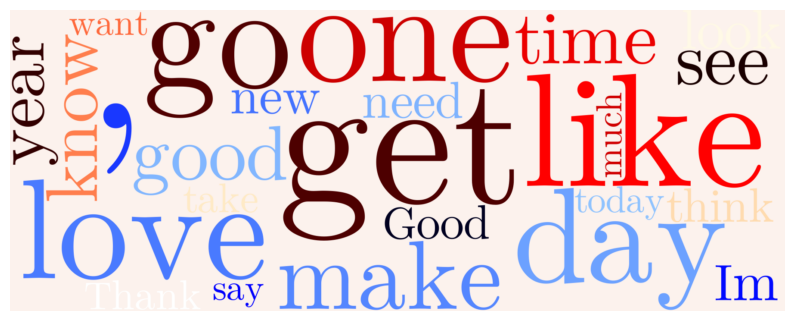

8 [('’', 734225), ('“', 254955), ('people', 211835), ('”', 194794), ('say', 169007), ('get', 151338), ('like', 142737), ('know', 131700), ('think', 130477), ('go', 128887), ('Trump', 113659), ('one', 113524), ('make', 108808), ('want', 106722), ('right', 99227), ('Putin', 97501), ('Biden', 94662), ('would', 94001), ('see', 81802), ('need', 80920), ('time', 79633), ('thing', 74820), ('us', 73651), ('take', 72866), ('dont', 67379)]


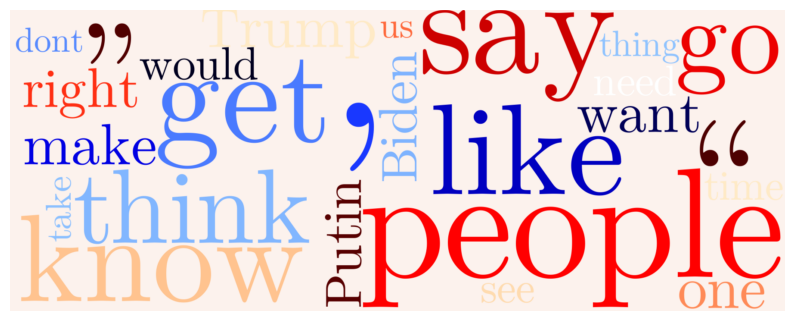

2 [('’', 292064), ('get', 110991), ('people', 105141), ('year', 90713), ('say', 87430), ('school', 80700), ('COVID19', 77969), ('“', 75925), ('new', 70170), ('test', 69471), ('COVID', 68654), ('work', 64874), ('mask', 60570), ('case', 60085), ('vaccine', 59205), ('make', 58640), ('go', 58501), ('need', 56754), ('one', 56689), ('child', 54113), ('”', 52540), ('US', 52190), ('health', 50661), ('state', 49328), ('take', 46939)]


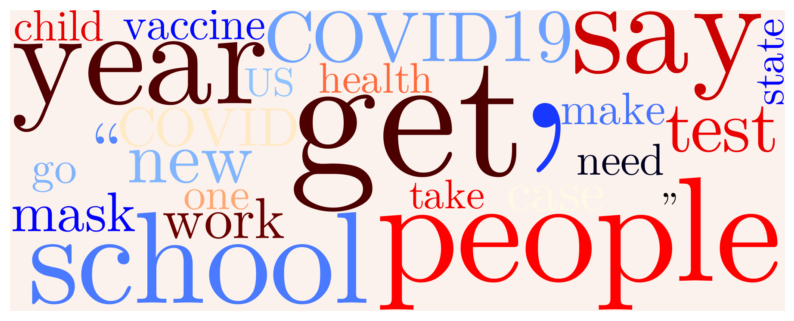

3 [('’', 332236), ('Trump', 207245), ('“', 114378), ('say', 109546), ('vote', 97510), ('House', 75625), ('Jan', 74325), ('Biden', 67970), ('Court', 67244), ('”', 67092), ('Senate', 62096), ('Supreme', 60542), ('election', 59505), ('right', 59197), ('President', 57593), ('BREAKING', 55684), ('US', 53242), ('Republican', 52051), ('get', 50360), ('GOP', 46700), ('year', 46078), ('call', 45911), ('January', 45818), ('Republicans', 45564), ('make', 44391)]


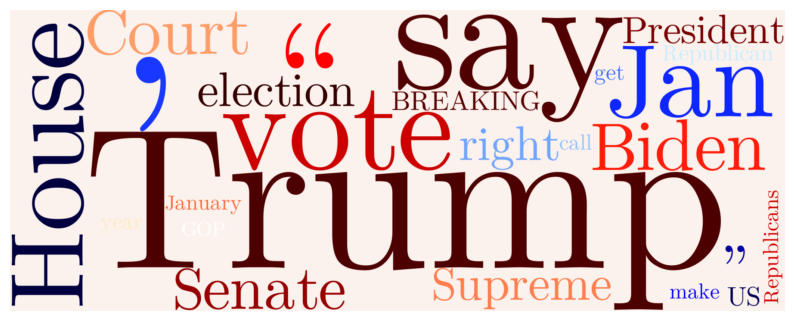

5 [('Ukraine', 242052), ('’', 223309), ('Russian', 204611), ('Russia', 171049), ('US', 115543), ('say', 102750), ('Putin', 83862), ('Ukrainian', 82367), ('“', 79761), ('war', 64886), ('Biden', 62609), ('President', 56836), ('”', 49828), ('Kyiv', 47704), ('people', 46716), ('military', 46513), ('BREAKING', 45753), ('force', 42494), ('oil', 37578), ('take', 37246), ('country', 36803), ('invasion', 36788), ('use', 36038), ('attack', 36017), ('new', 35736)]


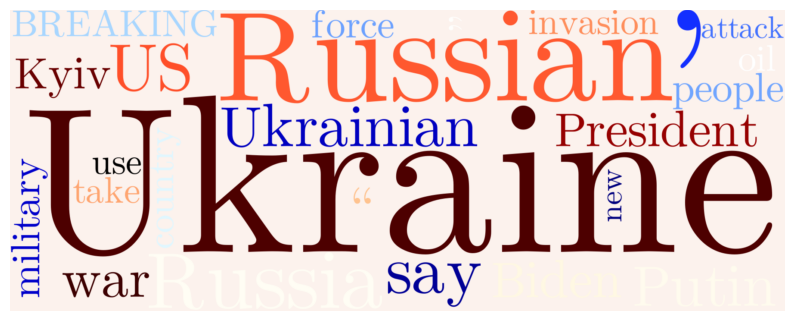

9 [('’', 180190), ('year', 51452), ('“', 48007), ('first', 38929), ('”', 38478), ('win', 36129), ('get', 34658), ('game', 33784), ('new', 33360), ('today', 32970), ('one', 31693), ('go', 31202), ('time', 27465), ('say', 27077), ('day', 26915), ('team', 26423), ('make', 25917), ('Happy', 24125), ('play', 23317), ('show', 22532), ('take', 22403), ('see', 22278), ('like', 21519), ('last', 21415), ('great', 20875)]


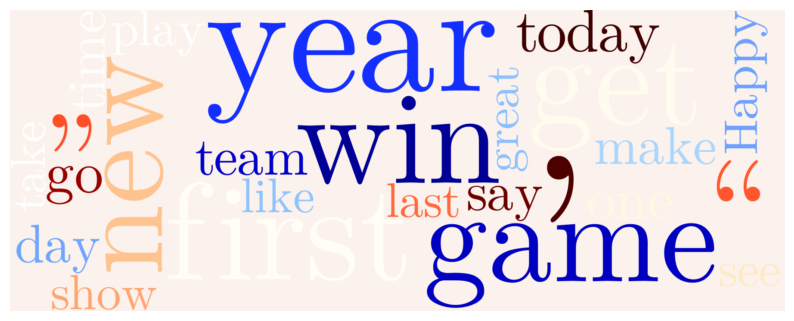

4 [('’', 67528), ('snow', 65334), ('tornado', 47801), ('storm', 45161), ('area', 43892), ('morning', 43156), ('today', 42107), ('weather', 40311), ('wind', 39753), ('fire', 39490), ('day', 35504), ('see', 34417), ('across', 34109), ('near', 33289), ('County', 30492), ('look', 29137), ('get', 27930), ('rain', 26266), ('winter', 25912), ('year', 24592), ('high', 24265), ('week', 23346), ('temperature', 23270), ('go', 22515), ('last', 22305)]


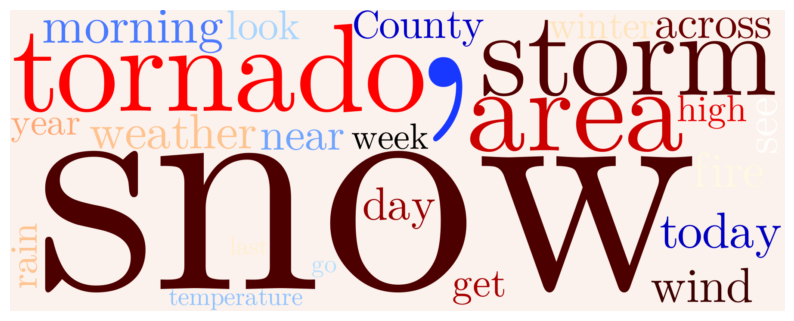

6 [('’', 78411), ('New', 51161), ('via', 50219), ('NowPlaying', 27483), ('‘', 25134), ('Listen', 21663), ('Learning', 21105), ('online', 21023), ('Machine', 20644), ('Day', 18770), ('artwork', 18754), ('sale', 17772), ('“', 16454), ('Warning', 15327), ('”', 14645), ('US', 14495), ('PM', 14049), ('News', 13228), ('Biden', 12801), ('issue', 12623), ('Trump', 12144), ('–', 10192), ('till', 10068), ('Ukraine', 9693), ('Jan', 9651)]


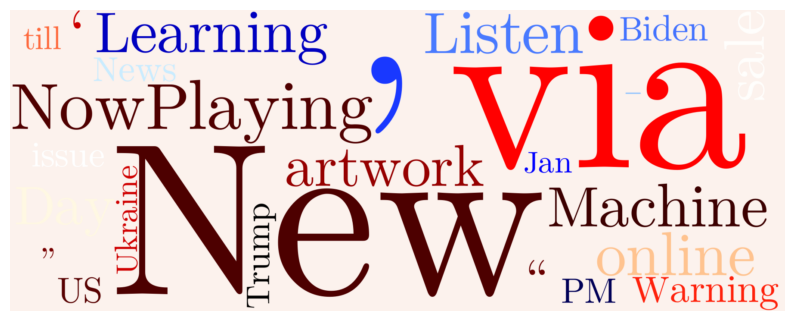

7 [('’', 31816), ('via', 30112), ('Check', 24964), ('book', 23183), ('new', 13106), ('love', 12290), ('“', 11757), ('…', 11694), ('”', 10084), ('shop', 9573), ('share', 9123), ('handmade', 9038), ('Vintage', 8659), ('New', 8552), ('read', 8495), ('gift', 8362), ('story', 7868), ('art', 7846), ('available', 7475), ('item', 7411), ('Christmas', 7354), ('etsy', 7226), ('Art', 7170), ('need', 7115), ('Hand', 6941)]


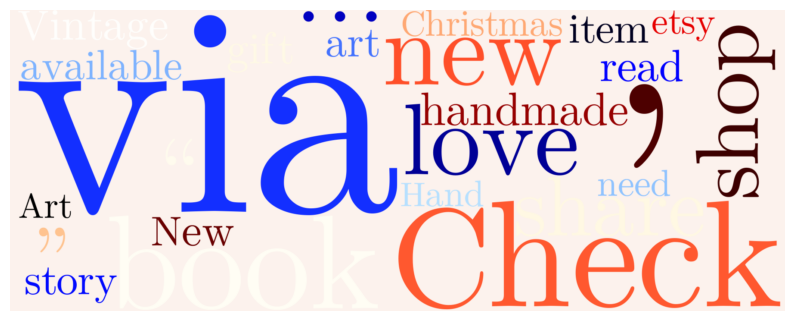

1 [('de', 70485), ('la', 34401), ('en', 24898), ('earthquake', 22186), ('que', 20516), ('el', 17519), ('km', 13988), ('un', 11917), ('magnitude', 10404), ('e', 9696), ('del', 9160), ('’', 8939), ('para', 8727), ('los', 8580), ('le', 8500), ('photography', 7696), ('con', 7639), ('se', 7531), ('por', 6545), ('La', 6408), ('una', 6107), ('nature', 6070), ('bear', 5965), ('UTC', 5544), ('NaturePhotography', 5315)]


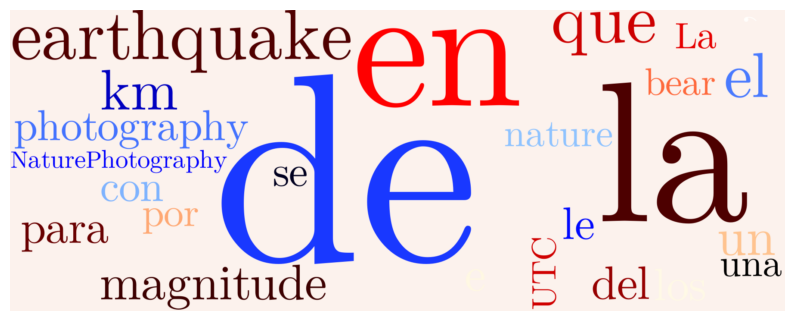

In [49]:
for cluster in top_index:
    draw_wordcloud(full_model, cluster, 25)

In [10]:
gsdmm2 = MovieGroupProcess(K=10, alpha=0.1, beta=0.3, n_iters=15)

In [11]:
gsdmm2.load("gsdmm_model")

In [12]:
gsdmm2.cluster_doc_count

[1111730,
 492994,
 300599,
 587051,
 342446,
 754712,
 192951,
 358657,
 226500,
 426645]

In [13]:
gsdmm2.cluster_word_distribution

[{'Todays': 285,
  'inspiration': 487,
  'Eliza': 15,
  'Todd': 227,
  'Brilliant': 262,
  'Thanks': 7351,
  'share': 8250,
  'Strange': 206,
  'coincidence': 306,
  'shady': 102,
  'humor': 702,
  'Trump': 7993,
  'Gets': 69,
  'Final': 62,
  'Okay': 1362,
  'Sell': 47,
  'DC': 891,
  'Hotel': 38,
  'Gosh': 211,
  '10K': 40,
  'follower': 3605,
  'achieve': 457,
  'Thank': 13971,
  'much': 24744,
  'Special': 92,
  'thanks': 2763,
  'everyone': 13090,
  'cringe': 226,
  'Told': 173,
  'Guy': 454,
  '…': 7189,
  'Four': 163,
  'Weeks': 6,
  'ago': 7505,
  'predict': 447,
  'doom': 398,
  'Ukraine': 4311,
  'say': 52208,
  'air…': 28,
  'Kitten': 39,
  'couldnt': 1957,
  'walk': 6760,
  'race': 1738,
  'big': 11179,
  'brother': 2661,
  'dinner': 1317,
  '❤️': 3963,
  'group': 2559,
  '‘': 7577,
  '’': 280067,
  'none': 1306,
  'succeed': 420,
  'strongly': 166,
  'advocate': 658,
  'try': 19653,
  'Even': 2878,
  'easy': 4320,
  'simulation': 57,
  'would': 32786,
  'tell': 22979,
  's

In [1]:
import pandas as pd
df = pd.read_csv("all_data_df_v1.csv")

/home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/tmp/ipykernel_42293/1366739633.py:2: DtypeWarning: Columns (0,2,4,5,6,7,8,11,12,13,15,16) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("all_data_df_v1.csv")


In [8]:
df["text"].to_csv("all_text_df_v1.csv" , header=False, index=False)

In [97]:
def find_hashtags(tweets):
    hashtags = []
    for tweet in tweets:
        if type(tweet) is str:
            # Extract hashtags using regular expression
            tags = re.findall(r"#(\w+)", tweet)
            hashtags.extend(tags)
    return hashtags

from collections import defaultdict

def calculate_document_frequency(tweets):
    df = defaultdict(int)
    for tweet in tweets:
        if type(tweet) is str:
            # Find hashtags in the tweet
            hashtags = set(re.findall(r"#(\w+)", tweet))
            # Increment the count for each unique hashtag in the tweet
            for hashtag in hashtags:
                df[hashtag] += 1
    return df


In [98]:
%%time
all_hashtags = calculate_document_frequency(tdf["text"].values)
len(all_hashtags)

CPU times: user 16.5 s, sys: 7.64 ms, total: 16.5 s
Wall time: 16.5 s


531221

In [101]:
pd.Series(all_hashtags).sort_values(ascending=False)

Ukraine                  53932
COVID19                  31633
NowPlaying               27997
Russia                   26015
ClimateAction            19577
                         ...  
IDDrought                    1
EndTheFoodTax                1
platinumjubilee              1
CommunityNotCommodity        1
TahtahmesDiary               1
Length: 531221, dtype: int64

In [105]:
%%time 
import re
from collections import defaultdict
from itertools import combinations
from tqdm import tqdm

def calculate_combined_document_frequency(tweets, combination_size=2):
    df = defaultdict(int)
    for tweet in tqdm(tweets, desc="Processing Tweets"):
        if type(tweet) is str:
            # Find hashtags in the tweet
            hashtags = set(re.findall(r"#(\w+)", tweet))
            # Consider combinations of the hashtags
            for combo in combinations(hashtags, combination_size):
                # Sort the combo to avoid different orderings of the same combo
                sorted_combo = tuple(sorted(combo))
                df[sorted_combo] += 1
    return df

# Example usage
tweets = [
    "Enjoying #sunshine and #beach",
    "#beach day with #sunshine is perfect",
    "Learning #Python and #coding",
    "#Python and #coding are fun",
    "#coding with #coffee"
]

tweets = tdf["text"].values

document_frequency = calculate_combined_document_frequency(tweets)
# for combo, freq in document_frequency.items():
#     print(f"{combo}: {freq}")


Processing Tweets: 100%|██████████| 14060535/14060535 [00:27<00:00, 513839.18it/s]

CPU times: user 27.4 s, sys: 179 ms, total: 27.5 s
Wall time: 27.8 s


In [108]:
pd.Series(document_frequency).sort_values(ascending=False)

Russia              Ukraine          13302
ClimateAction       ClimateCrisis     4670
art                 artist            3844
Radiowaves          RockinFaves       3598
Putin               Ukraine           3465
                                     ...  
county              on                   1
bleckley            drug                 1
drug                teacher              1
county              drug                 1
GOPBetrayedAmerica  January6th           1
Length: 3498887, dtype: int64

In [30]:
%%time 
import re
from collections import defaultdict
from itertools import combinations
from tqdm import tqdm

def calculate_all_combinations_document_frequency(tweets, max_combo_size = 4):
    df = defaultdict(int)
    for tweet in tqdm(tweets, desc="Processing Tweets"):
        if type(tweet) is str:
            # Find hashtags in the tweet
            hashtags = set(re.findall(r"#(\w+)", tweet))
            # Consider all combinations of the hashtags
            for size in range(1, min(max_combo_size, len(hashtags) + 1)):
                for combo in combinations(hashtags, size):
                    # Sort the combo to avoid different orderings of the same combo
                    sorted_combo = tuple(sorted(combo))
                    df[sorted_combo] += 1
    return df

document_frequency = calculate_all_combinations_document_frequency(tdf["text"].values)
len(document_frequency)

Processing Tweets: 100%|██████████| 14060535/14060535 [00:53<00:00, 262181.79it/s]

CPU times: user 52.6 s, sys: 1.08 s, total: 53.7 s
Wall time: 53.6 s


14614241

In [31]:
sorted_document_frequency = sorted(document_frequency.items(), key=lambda x: x[1], reverse=True)
sorted_document_frequency

[(('Ukraine',), 53932),
 (('COVID19',), 31633),
 (('NowPlaying',), 27997),
 (('Russia',), 26015),
 (('ClimateAction',), 19577),
 (('BREAKING',), 17717),
 (('art',), 15793),
 (('nature',), 15185),
 (('photography',), 15176),
 (('earthquake',), 13818),
 (('ClimateCrisis',), 13765),
 (('Russia', 'Ukraine'), 13302),
 (('StandWithUkraine',), 12616),
 (('NaturePhotography',), 11067),
 (('MarshallFire',), 10960),
 (('1',), 9997),
 (('climatechange',), 9644),
 (('Omicron',), 9522),
 (('handmade',), 8361),
 (('txwx',), 8333),
 (('Texas',), 8187),
 (('Putin',), 8151),
 (('California',), 8083),
 (('climate',), 7899),
 (('KCBSTraffic',), 7661),
 (('etsy',), 7558),
 (('ClimateChange',), 7514),
 (('TheSims4',), 7481),
 (('DemVoice1',), 7344),
 (('Russian',), 7165),
 (('AI',), 7074),
 (('USA',), 7059),
 (('meditation',), 6883),
 (('NYCACC',), 6877),
 (('etsymntt',), 6630),
 (('snow',), 6597),
 (('China',), 6573),
 (('Kyiv',), 6356),
 (('Christmas',), 6312),
 (('cosplay',), 6249),
 (('SupportSmallStre

In [32]:
df = pd.DataFrame(sorted_document_frequency, columns=['Hashtag Combination', 'Frequency'])
df

,Hashtag Combination,Frequency
0,"(Ukraine,)",53932
1,"(COVID19,)",31633
2,"(NowPlaying,)",27997
3,"(Russia,)",26015
4,"(ClimateAction,)",19577
...,...,...
14614236,"(Boss, MVP)",1
14614237,"(SCOTUS, SaveRoe)",1
14614238,"(laurenUnderwood,)",1
14614239,"(KamalaHarris, laurenUnderwood)",1


In [34]:
df["NumHashtags"] = df["Hashtag Combination"].apply(lambda x: len(x))

In [38]:
df.iloc[:100][df.iloc[:100]["NumHashtags"] > 1]

,Hashtag Combination,Frequency,NumHashtags
11,"(Russia, Ukraine)",13302,2
69,"(ClimateAction, ClimateCrisis)",4670,2
96,"(art, artist)",3844,2


In [29]:
df['Hashtag Combination'].iloc[:10]

0                 (Russia, Ukraine)
1    (ClimateAction, ClimateCrisis)
2                     (art, artist)
3         (Radiowaves, RockinFaves)
4                  (Putin, Ukraine)
5             (nature, photography)
6               (INDIGENOUS, TAIRP)
7         (RADIOWAVES, ROCKINFAVES)
8                       (Hope, USA)
9                   (Putin, Russia)
Name: Hashtag Combination, dtype: object

In [40]:
tdf["hashtags"] = tdf["text"].apply(lambda x: set(re.findall(r"#(\w+)", x)) if type(x) is str else set())
tdf

,id,conversation_id,edit_history_tweet_ids,author_id,created_at,text,impression_count,like_count,quote_count,reply_count,retweet_count,quoted,replied_to,retweeted,in_reply_to_user_id,geo,mentions,hashtags
0,1509757106202849291,1500971180395802633,['1509757106202849291'],1385729645740449804,2022-04-01 04:58:38+00:00,@Peroporqu_ :),0,0,0,0,0,[],['1500971180395802633'],[],1500536286591033351,NaN,['1500536286591033351'],{}
1,1509756641117319168,1509756641117319168,['1509756641117319168'],4501930040,2022-04-01 04:56:47+00:00,RT @purpleluvrain: @jlints58 love it dear swee...,0,0,0,0,1,[],[],['1509404114555334659'],NaN,NaN,"['781947948934369280', '4501930040']",{}
2,1509756540265414656,1509732884608860161,['1509756540265414656'],28729354,2022-04-01 04:56:23+00:00,@StephanieNTX @dfwhispanic @Raquel_AmparoTV @S...,0,0,0,0,0,[],['1509743982724595715'],[],3173688997,NaN,"['3173688997', '761051', '402718868', '7663422...",{}
3,1509756323231002627,1507144019482083339,['1509756323231002627'],4501930040,2022-04-01 04:55:32+00:00,@SFDamnPodcast @alvatabitha I've been wonderin...,0,0,0,0,0,[],['1509402710470103044'],[],1248074962377699328,NaN,"['1248074962377699328', '66141034']",{}
4,1509756190716096512,1509756190716096512,['1509756190716096512'],4501930040,2022-04-01 04:55:00+00:00,RT @SFDamnPodcast: @alvatabitha @jlints58 a gr...,0,0,0,0,1,[],[],['1509402710470103044'],NaN,NaN,"['1248074962377699328', '66141034', '4501930040']",{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14060530,1465918181088710659,1465918181088710659,['1465918181088710659'],25444322,2021-12-01 05:38:24+00:00,#GetVaccinated https://t.co/MHvXKKv5Fv,0,0,0,0,0,['1465701709112434693'],[],[],NaN,"Union City, CA",[],{GetVaccinated}
14060531,1465918067775447045,1465918067775447045,['1465918067775447045'],25444322,2021-12-01 05:37:57+00:00,RT @UncvrngTheTruth: Jim Jordan said Biden thi...,0,0,0,0,358,[],[],['1465487354546638853'],NaN,NaN,[],{}
14060532,1465914960844705794,1465803774291677187,['1465914960844705794'],40091601,2021-12-01 05:25:36+00:00,@SoCassandra another family star,0,0,0,0,0,[],['1465803774291677187'],[],48928145,NaN,['48928145'],{}
14060533,1465914356332326914,1465914290435772417,['1465914356332326914'],40091601,2021-12-01 05:23:12+00:00,@dmschmeyer *saves*,0,0,0,0,0,[],['1465914290435772417'],[],732409522778742784,NaN,['732409522778742784'],{}


In [41]:
rus_ukr = tdf[tdf["hashtags"].apply(lambda x: "Russia" in x and "Ukraine" in x)]
rus_ukr

,id,conversation_id,edit_history_tweet_ids,author_id,created_at,text,impression_count,like_count,quote_count,reply_count,retweet_count,quoted,replied_to,retweeted,in_reply_to_user_id,geo,mentions,hashtags
3014,1508878392422195207,1508878392422195207,['1508878392422195207'],1031312835744284677,2022-03-29 18:46:57+00:00,RT @globaltimesnews: The latest round of #Russ...,0,0,0,0,9,[],[],['1508828504019783680'],NaN,NaN,['49616273'],"{Ukraine, Russia}"
3927,1508542455737630723,1508542455737630723,['1508542455737630723'],61399101,2022-03-28 20:32:03+00:00,RT @FrankVollmer: Russian invasion in #Ukraine...,0,0,0,0,163,[],[],['1508369966768209922'],NaN,NaN,['241989956'],"{Ukraine, Russia}"
4229,1508437241114288128,1508437241114288128,['1508437241114288128'],61399101,2022-03-28 13:33:58+00:00,RT @KyivPost: The most severe ground fighting ...,0,0,0,0,57,[],[],['1508367918840569856'],NaN,NaN,['14106476'],"{Ukraine, Russia}"
4980,1508109237708283914,1508109237708283914,['1508109237708283914'],61399101,2022-03-27 15:50:36+00:00,RT @PaulaChertok: 🧵ICYMI #Russia's war on #Ukr...,0,0,0,0,8,[],[],['1508108000157831169'],NaN,NaN,['763010018'],"{Ukraine, Russia}"
6196,1507705135325134857,1507705135325134857,['1507705135325134857'],61399101,2022-03-26 13:04:50+00:00,RT @olex_scherba: #Ukraine’s mil intelligence ...,0,0,0,0,894,[],[],['1507660518823239684'],NaN,NaN,['163018653'],"{Ukraine, Russia}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14029873,1501315334846009345,1501315334846009345,['1501315334846009345'],427515851,2022-03-08 21:54:03+00:00,RT @TheStudyofWar: Here is the latest control-...,0,0,0,0,354,[],[],['1501302732547932161'],NaN,NaN,"['71298686', '71298686', '106738320']","{Ukraine, Russia}"
14031027,1500091533470560256,1500091533470560256,['1500091533470560256'],982564830,2022-03-05 12:51:06+00:00,"RT @Matt_VanDyke: Few seemed to notice, but a ...",0,0,0,0,278,[],[],['1499414717810585602'],NaN,NaN,['431071870'],"{Ukraine, Russia}"
14033265,1498302499861635074,1498302499861635074,['1498302499861635074'],982564830,2022-02-28 14:22:07+00:00,RT @j_alfarra: Talks with #Russia begin as #Uk...,0,0,0,0,344,[],[],['1498245504299421697'],NaN,NaN,['234058909'],"{Belarus, Ukraine, Russia}"
14036484,1495935354259800064,1495935354259800064,['1495935354259800064'],982564830,2022-02-22 01:35:56+00:00,RT @Jake_Hanrahan: #Ukraine: Footage of #Russi...,0,0,0,0,2651,[],[],['1495877460944203777'],NaN,NaN,['77853610'],"{Ukraine, Russia}"


In [42]:
ukr = tdf[tdf["hashtags"].apply(lambda x: "Ukraine" in x)]
ukr

,id,conversation_id,edit_history_tweet_ids,author_id,created_at,text,impression_count,like_count,quote_count,reply_count,retweet_count,quoted,replied_to,retweeted,in_reply_to_user_id,geo,mentions,hashtags
765,1509535595906883588,1509535595906883588,['1509535595906883588'],61399101,2022-03-31 14:18:26+00:00,RT @nexta_tv: #Spanish government has sent a t...,0,0,0,0,822,[],[],['1509509759363428353'],NaN,NaN,['1891490382'],"{Spanish, Ukraine}"
781,1509534909249073153,1509534909249073153,['1509534909249073153'],61399101,2022-03-31 14:15:42+00:00,"RT @nexta_tv: A ""rail war"" has broken out in #...",0,0,0,0,1091,[],[],['1509437820540227588'],NaN,NaN,['1891490382'],"{Belarus, Bela, Russian, Ukraine}"
987,1509519805363232772,1509519805363232772,['1509519805363232772'],61399101,2022-03-31 13:15:41+00:00,RT @ICRC: UPDATE: Our team in #Ukraine is on t...,0,0,0,0,132,[],[],['1509466156150702081'],NaN,NaN,['85289376'],"{Mariupo, Ukraine}"
1596,1509335668979388417,1509335668979388417,['1509335668979388417'],61399101,2022-03-31 01:04:00+00:00,RT @nexta_tv: #Ukraine is negotiating with #Po...,0,0,0,0,490,[],[],['1509296263925276675'],NaN,NaN,['1891490382'],"{Belarus, Ukraine, Poland}"
2291,1509229503595393027,1509229503595393027,['1509229503595393027'],28729354,2022-03-30 18:02:08+00:00,Calling all journalists in the #Chicago area. ...,0,11,1,0,5,[],[],[],NaN,NaN,"['36410927', '16001827', '21401691', '37475218...","{Chicago, Ukraine}"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14038494,1493680303700774916,1493680303700774916,['1493680303700774916'],982564830,2022-02-15 20:15:10+00:00,RT @netblocks: ⚠️ Confirmed: Real-time network...,0,0,0,0,1123,[],[],['1493631119669047299'],NaN,NaN,['815297463695327234'],{Ukraine}
14038863,1493240737470709761,1493240737470709761,['1493240737470709761'],25444322,2022-02-14 15:08:29+00:00,RT @MalcolmNance: THIS. #Ukraine,0,0,0,0,118,[],[],['1493154407650787328'],NaN,NaN,['2573480784'],{Ukraine}
14039302,1492637391294717952,1492637391294717952,['1492637391294717952'],427515851,2022-02-12 23:11:00+00:00,RT @YorukIsik: #Ukraine crisis: Armed with Nov...,0,0,0,0,317,[],[],['1492531229882830861'],NaN,NaN,['327206200'],"{ВМФ, Ukraine, ЧФ}"
14039645,1492358767924563969,1492358767924563969,['1492358767924563969'],25444322,2022-02-12 04:43:51+00:00,RT @MalcolmNance: #Ukraine Know what’s missing...,0,0,0,0,1468,[],[],['1492354527089016836'],NaN,NaN,['2573480784'],{Ukraine}
